In [1]:
import pandas as pd 
import numpy as np

# Raccolta dati e preprocessamento

* Di seguito definiamo una funzione ausiliaria che permette l'estrazione dei soli dati relativi alla località d'interesse.

In [2]:
def leggi_e_filtra(percorso, 
                   colonna1_filtro=None, valore1_filtro=None,
                   ):
    # Leggiamo il CSV
    df = pd.read_csv(percorso, low_memory=False)
    
    
  
    if colonna1_filtro:
        df[colonna1_filtro]=df[colonna1_filtro].str.strip()
    # Applichiamo il filtro
    if colonna1_filtro and valore1_filtro:
        df = df[df[colonna1_filtro] == valore1_filtro]
    # Resettiamo l' indice 
    df = df.reset_index(drop=True)
    
    return df


In [3]:
dfaqi_19 = leggi_e_filtra(
    "dati climatici/dailyAQI19-24-20251205T100640Z-1-001/dailyAQI19-24/daily_aqi_by_cbsa_2019/daily_aqi_by_cbsa_2019.csv",
    colonna1_filtro="CBSA", valore1_filtro="Bakersfield, CA",
   )
dfaqi_19=dfaqi_19[["Date","AQI"]]
dfaqi_20 = leggi_e_filtra(
    "dati climatici/dailyAQI19-24-20251205T100640Z-1-001/dailyAQI19-24/daily_aqi_by_cbsa_2020/daily_aqi_by_cbsa_2020.csv",
    colonna1_filtro="CBSA", valore1_filtro="Bakersfield, CA",
   )
dfaqi_20=dfaqi_20[["Date","AQI"]]
dfaqi_21 = leggi_e_filtra(
    "dati climatici/dailyAQI19-24-20251205T100640Z-1-001/dailyAQI19-24/daily_aqi_by_cbsa_2021/daily_aqi_by_cbsa_2021.csv",
    colonna1_filtro="CBSA", valore1_filtro="Bakersfield, CA", 
   )
dfaqi_21=dfaqi_21[["Date","AQI"]]
col_dfaqi = [dfaqi_19, dfaqi_20, dfaqi_21]
df_aqi= pd.concat(col_dfaqi, ignore_index=True)

df_aqi= df_aqi[["Date","AQI"]]
df_aqi

,Date,AQI
0,2019-01-01,107
1,2019-01-02,91
2,2019-01-03,103
3,2019-01-04,108
4,2019-01-05,81
...,...,...
1091,2021-12-27,52
1092,2021-12-28,117
1093,2021-12-29,36
1094,2021-12-30,130


* variante della funzione definita in precedenza : per tutte le variabili diverse da AQI filtriamo su più campi

In [4]:
def leggi_e_filtra(percorso, 
                   colonna1_filtro=None, valore1_filtro=None,
                   colonna2_filtro=None, valore2_filtro=None,
                   colonna3_filtro=None, valore3_filtro=None):
    # Lettura CSV
    df = pd.read_csv(percorso, low_memory=False)
    
    # Pulizia spazi per le colonne usate nei filtri
    for col in [colonna1_filtro, colonna2_filtro, colonna3_filtro]:
        if col:
            df[col] = df[col].str.strip()
    
    # Applichiamo i filtri uno per uno 
    if colonna1_filtro and valore1_filtro:
        df = df[df[colonna1_filtro] == valore1_filtro]
    if colonna2_filtro and valore2_filtro:
        df = df[df[colonna2_filtro] == valore2_filtro]
    if colonna3_filtro and valore3_filtro:
        df = df[df[colonna3_filtro] == valore3_filtro]
    
    # Resettiamo l'indice
    df = df.reset_index(drop=True)
    
    return df


In [5]:
ozono19_ = leggi_e_filtra(
    "dati climatici/daily19-24-20251205T100637Z-1-001/daily19-24/daily_44201_2019/daily_44201_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)

ozono20_ = leggi_e_filtra(
    "dati climatici/daily19-24-20251205T100637Z-1-001/daily19-24/daily_44201_2020/daily_44201_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
ozono21_ = leggi_e_filtra(
    "dati climatici/daily19-24-20251205T100637Z-1-001/daily19-24/daily_44201_2021/daily_44201_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_ozon = [ozono19_, ozono20_, ozono21_]
ozono_= pd.concat(col_ozon, ignore_index=True)
ozono_=ozono_[["Parameter Name","Arithmetic Mean","Date Local"]]
ozono_

,Parameter Name,Arithmetic Mean,Date Local
0,Ozone,0.011176,2019-01-01
1,Ozone,0.010294,2019-01-02
2,Ozone,0.008706,2019-01-03
3,Ozone,0.009706,2019-01-04
4,Ozone,0.019824,2019-01-05
...,...,...,...
1089,Ozone,0.018941,2021-12-27
1090,Ozone,0.018706,2021-12-28
1091,Ozone,0.009471,2021-12-29
1092,Ozone,0.013529,2021-12-30


In [6]:
no2_19 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42602_2019/daily_42602_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
no2_20 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42602_2020/daily_42602_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
no2_21 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42602_2021/daily_42602_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_no2 = [no2_19, no2_20, no2_21]
no2_= pd.concat(col_no2, ignore_index=True)

no2_= no2_[["Parameter Name","Arithmetic Mean","Date Local"]]
no2_

,Parameter Name,Arithmetic Mean,Date Local
0,Nitrogen dioxide (NO2),15.900000,2019-01-01
1,Nitrogen dioxide (NO2),21.313043,2019-01-02
2,Nitrogen dioxide (NO2),24.652174,2019-01-03
3,Nitrogen dioxide (NO2),25.065217,2019-01-04
4,Nitrogen dioxide (NO2),16.695652,2019-01-05
...,...,...,...
1090,Nitrogen dioxide (NO2),13.865217,2021-12-27
1091,Nitrogen dioxide (NO2),10.186957,2021-12-28
1092,Nitrogen dioxide (NO2),16.765217,2021-12-29
1093,Nitrogen dioxide (NO2),8.713043,2021-12-30


In [7]:
co_19 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42101_2019/daily_42101_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-Muni"
)
co_20 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42101_2020/daily_42101_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-Muni"
)
co_21 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42101_2021/daily_42101_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-Muni"
)
col_co = [co_19, co_20, co_21]
co_= pd.concat(col_co, ignore_index=True)
co_=co_[co_["Sample Duration"]== "1 HOUR"]

co_= co_[["Parameter Name","Arithmetic Mean","Date Local"]]
co_=co_.reset_index(drop="True")
co_

,Parameter Name,Arithmetic Mean,Date Local
0,Carbon monoxide,0.536522,2019-01-01
1,Carbon monoxide,0.488095,2019-01-02
2,Carbon monoxide,0.503043,2019-01-03
3,Carbon monoxide,0.522174,2019-01-04
4,Carbon monoxide,0.430455,2019-01-05
...,...,...,...
1068,Carbon monoxide,0.201111,2021-12-27
1069,Carbon monoxide,0.196000,2021-12-28
1070,Carbon monoxide,0.243043,2021-12-29
1071,Carbon monoxide,0.237826,2021-12-30


* Prima città più vicina con dati disponibili è Fresno, circa 100 miglia di distanza (per la variabile SO2)

In [8]:
so2_19 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42401_2019/daily_42401_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Fresno",
    colonna2_filtro="CBSA Name", valore2_filtro="Fresno, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Fresno - Garland"
)
so2_20 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42401_2020/daily_42401_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Fresno",
    colonna2_filtro="CBSA Name", valore2_filtro="Fresno, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Fresno - Garland"
)
so2_21 = leggi_e_filtra(
    "dati climatici/so2-co-no2-19--21-20251205T100712Z-1-001/so2-co-no2-19--21/daily_42401_2021/daily_42401_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Fresno",
    colonna2_filtro="CBSA Name", valore2_filtro="Fresno, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Fresno - Garland"
)
col_so2 = [so2_19, so2_20, so2_21]
so2= pd.concat(col_so2, ignore_index=True)
so2 = so2 [so2["Sample Duration"]=="1 HOUR"]

so2_= so2[["Parameter Name","Arithmetic Mean","Date Local"]]
so2_

,Parameter Name,Arithmetic Mean,Date Local
0,Sulfur dioxide,0.058333,2019-01-01
1,Sulfur dioxide,0.216667,2019-01-02
2,Sulfur dioxide,0.191667,2019-01-03
3,Sulfur dioxide,0.233333,2019-01-04
4,Sulfur dioxide,0.070833,2019-01-05
...,...,...,...
1797,Sulfur dioxide,0.004167,2021-12-27
1798,Sulfur dioxide,0.029167,2021-12-28
1799,Sulfur dioxide,0.000000,2021-12-29
1800,Sulfur dioxide,0.112500,2021-12-30


In [9]:
first_pm2_19 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_88101_2019/daily_88101_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
first_pm2_20 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_88101_2020/daily_88101_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
first_pm2_21 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_88101_2021/daily_88101_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_first_pm2 = [first_pm2_19,first_pm2_20,first_pm2_21]
first_pm2= pd.concat(col_first_pm2, ignore_index=True)

first_pm2_= first_pm2[["Parameter Name","Arithmetic Mean","Date Local"]]
first_pm2_

,Parameter Name,Arithmetic Mean,Date Local
0,PM2.5 - Local Conditions,37.8,2019-01-01
1,PM2.5 - Local Conditions,30.8,2019-01-02
2,PM2.5 - Local Conditions,36.3,2019-01-03
3,PM2.5 - Local Conditions,38.3,2019-01-04
4,PM2.5 - Local Conditions,22.5,2019-01-05
...,...,...,...
1112,PM2.5 - Local Conditions,48.7,2021-11-11
1113,PM2.5 - Local Conditions,47.1,2021-11-18
1114,PM2.5 - Local Conditions,47.0,2021-11-30
1115,PM2.5 - Local Conditions,24.8,2021-12-12


In [10]:
duplicati = first_pm2_[first_pm2_.duplicated(subset=["Date Local"])]
duplicati

,Parameter Name,Arithmetic Mean,Date Local
347,PM2.5 - Local Conditions,10.1,2019-01-09
358,PM2.5 - Local Conditions,45.8,2019-01-25
359,PM2.5 - Local Conditions,1.0,2019-02-02
360,PM2.5 - Local Conditions,5.7,2019-02-14
361,PM2.5 - Local Conditions,9.5,2019-02-22
...,...,...,...
1112,PM2.5 - Local Conditions,48.7,2021-11-11
1113,PM2.5 - Local Conditions,47.1,2021-11-18
1114,PM2.5 - Local Conditions,47.0,2021-11-30
1115,PM2.5 - Local Conditions,24.8,2021-12-12


In [11]:
# Troviamo  gli indici dei record con valore massimo per ogni data
_indici_ = first_pm2_.groupby("Date Local")["Arithmetic Mean"].idxmax()

# Selezioniamo solo quei record 
first_pm2_ = first_pm2_.loc[_indici_].sort_values("Date Local").reset_index(drop=True)
first_pm2_

,Parameter Name,Arithmetic Mean,Date Local
0,PM2.5 - Local Conditions,37.8,2019-01-01
1,PM2.5 - Local Conditions,30.8,2019-01-02
2,PM2.5 - Local Conditions,36.3,2019-01-03
3,PM2.5 - Local Conditions,38.3,2019-01-04
4,PM2.5 - Local Conditions,22.5,2019-01-05
...,...,...,...
1031,PM2.5 - Local Conditions,4.9,2021-12-27
1032,PM2.5 - Local Conditions,4.5,2021-12-28
1033,PM2.5 - Local Conditions,6.4,2021-12-29
1034,PM2.5 - Local Conditions,11.8,2021-12-30


In [12]:
second_pm2_19 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_88502_2019/daily_88502_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
second_pm2_20 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_88502_2020/daily_88502_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
second_pm2_21 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_88502_2021/daily_88502_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_second_pm2 = [second_pm2_19,second_pm2_20,second_pm2_21]
second_pm2= pd.concat(col_second_pm2, ignore_index=True)
second_pm2=second_pm2[second_pm2["Sample Duration"]=="1 HOUR"]
second_pm2_= second_pm2[["Parameter Name","Arithmetic Mean","Date Local"]]
second_pm2_.reset_index(drop=True)

,Parameter Name,Arithmetic Mean,Date Local
0,Acceptable PM2.5 AQI & Speciation Mass,33.250000,2019-01-01
1,Acceptable PM2.5 AQI & Speciation Mass,26.375000,2019-01-02
2,Acceptable PM2.5 AQI & Speciation Mass,31.250000,2019-01-03
3,Acceptable PM2.5 AQI & Speciation Mass,31.750000,2019-01-04
4,Acceptable PM2.5 AQI & Speciation Mass,18.541667,2019-01-05
...,...,...,...
1087,Acceptable PM2.5 AQI & Speciation Mass,4.125000,2021-12-27
1088,Acceptable PM2.5 AQI & Speciation Mass,3.916667,2021-12-28
1089,Acceptable PM2.5 AQI & Speciation Mass,5.583333,2021-12-29
1090,Acceptable PM2.5 AQI & Speciation Mass,9.375000,2021-12-30


In [13]:
pm10_19 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_81102_2019/daily_81102_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Oildale",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Oildale"
)
pm10_20 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_81102_2020/daily_81102_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Oildale",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Oildale"
)
pm10_21 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_81102_2021/daily_81102_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Oildale",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Oildale"
)
col_pm10 = [pm10_19,pm10_20,pm10_21]
pm10= pd.concat(col_pm10, ignore_index=True)

pm10_= pm10[["Parameter Name","Arithmetic Mean","Date Local"]]
pm10_

,Parameter Name,Arithmetic Mean,Date Local
0,PM10 Total 0-10um STP,26,2019-01-01
1,PM10 Total 0-10um STP,41,2019-01-02
2,PM10 Total 0-10um STP,54,2019-01-03
3,PM10 Total 0-10um STP,54,2019-01-04
4,PM10 Total 0-10um STP,92,2019-01-05
...,...,...,...
1039,PM10 Total 0-10um STP,4,2021-12-27
1040,PM10 Total 0-10um STP,5,2021-12-28
1041,PM10 Total 0-10um STP,4,2021-12-29
1042,PM10 Total 0-10um STP,9,2021-12-30


* Fresna è la città più vicina a Bakersfield con disponibilità di dati

In [14]:
pmc_19 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_86101_2019/daily_86101_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Fresno",
    colonna2_filtro="CBSA Name", valore2_filtro="Fresno, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Fresno - Garland"
)
#pmc_19 = pmc_19.loc[6752:7115]
pmc_20 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_86101_2020/daily_86101_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Fresno",
    colonna2_filtro="CBSA Name", valore2_filtro="Fresno, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Fresno - Garland"
)
#pmc_20 = pmc_20.loc[6686:7049]
pmc_21 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_86101_2021/daily_86101_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Fresno",
    colonna2_filtro="CBSA Name", valore2_filtro="Fresno, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Fresno - Garland"
)
#pmc_21 = pmc_21.loc[6486:6844]
col_pmc = [pmc_19,pmc_20,pmc_21]
pmc= pd.concat(col_pmc, ignore_index=True)

pmc_= pmc[["Parameter Name","Arithmetic Mean","Date Local"]]
pmc_

,Parameter Name,Arithmetic Mean,Date Local
0,PM10-2.5 - Local Conditions,6.800000,2019-01-01
1,PM10-2.5 - Local Conditions,12.529167,2019-01-02
2,PM10-2.5 - Local Conditions,14.043478,2019-01-03
3,PM10-2.5 - Local Conditions,16.870833,2019-01-04
4,PM10-2.5 - Local Conditions,7.387500,2019-01-05
...,...,...,...
2135,PM10-2.5 - Local Conditions,9.700000,2021-12-12
2136,PM10-2.5 - Local Conditions,7.900000,2021-12-18
2137,PM10-2.5 - Local Conditions,2.800000,2021-12-24
2138,PM10-2.5 - Local Conditions,1.500000,2021-12-27


In [15]:
# Troviamo gli indici dei record con valore massimo per ogni data
idx = pmc_.groupby("Date Local")["Arithmetic Mean"].idxmax()

# Selezioniamo solo quei record 
pmc_ = pmc_.loc[idx].sort_values("Date Local").reset_index(drop=True)
pmc_

,Parameter Name,Arithmetic Mean,Date Local
0,PM10-2.5 - Local Conditions,9.291667,2019-01-01
1,PM10-2.5 - Local Conditions,16.358333,2019-01-02
2,PM10-2.5 - Local Conditions,14.683333,2019-01-03
3,PM10-2.5 - Local Conditions,18.354167,2019-01-04
4,PM10-2.5 - Local Conditions,8.745833,2019-01-05
...,...,...,...
1086,PM10-2.5 - Local Conditions,4.691667,2021-12-27
1087,PM10-2.5 - Local Conditions,6.991667,2021-12-28
1088,PM10-2.5 - Local Conditions,3.360870,2021-12-29
1089,PM10-2.5 - Local Conditions,7.841667,2021-12-30


In [16]:
pm10s_19 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_PM10SPEC_2019/daily_PM10SPEC_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Mojave",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Mojave"
)
pm10s_20 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_PM10SPEC_2020/daily_PM10SPEC_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Not in a city",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Canebrake"
)
pm10s_21 = leggi_e_filtra(
    "dati climatici/particulates-19--21-20251205T100650Z-1-001/particulates-19--21/daily_PM10SPEC_2021/daily_PM10SPEC_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_pm10s = [pm10s_19,pm10s_20,pm10s_21]
pm10s= pd.concat(col_pm10s, ignore_index=True)
pm10s_=pm10s[pm10s["Parameter Name"]=="PM10 Total 0-10um STP"]
pm10s_= pm10s_[["Parameter Name","Arithmetic Mean","Date Local"]]
pm10s_.reset_index(drop=True)

,Parameter Name,Arithmetic Mean,Date Local
0,PM10 Total 0-10um STP,5.875000,2019-01-01
1,PM10 Total 0-10um STP,12.250000,2019-01-02
2,PM10 Total 0-10um STP,13.666667,2019-01-03
3,PM10 Total 0-10um STP,11.250000,2019-01-04
4,PM10 Total 0-10um STP,8.250000,2019-01-05
...,...,...,...
1042,PM10 Total 0-10um STP,10.583333,2021-12-27
1043,PM10 Total 0-10um STP,9.916667,2021-12-28
1044,PM10 Total 0-10um STP,15.541667,2021-12-29
1045,PM10 Total 0-10um STP,10.916667,2021-12-30


* Il PM2.5 Speciation non può essere preso in considerazione perchè il campionamento non è su base giornaliera

pm2s_19 = leggi_e_filtra(
    "Downloads/particulates-19--21/daily_SPEC_2019/daily_SPEC_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Mojave",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Mojave"
)
pm2s_20 = leggi_e_filtra(
    "Downloads/particulates-19--21/daily_SPEC_2020/daily_SPEC_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Not in a city",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Canebrake"
)
pm2s_21 = leggi_e_filtra(
    "Downloads/particulates-19--21/daily_SPEC_2021/daily_SPEC_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_pm2s = [pm2s_19,pm2s_20,pm2s_21]
pm2s= pd.concat(col_pm2s, ignore_index=True)
#pm10s_=pm10s[pm10s["Parameter Name"]=="PM10 Total 0-10um STP"]
pm2s_= pm2s[["Parameter Name","Arithmetic Mean","Date Local"]]
pm2s_.reset_index(drop=True)

In [17]:
wind_19 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_WIND_2019/daily_WIND_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
wind_20 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_WIND_2020/daily_WIND_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
wind_21 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_WIND_2021/daily_WIND_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
col_wind = [wind_19,wind_20,wind_21]
wind_= pd.concat(col_wind, ignore_index=True)
wind_=wind_[wind_["Units of Measure"]== "Knots"]

wind_= wind_[["Parameter Name","Arithmetic Mean","Date Local"]]
wind_=wind_.reset_index(drop="True")
wind_

,Parameter Name,Arithmetic Mean,Date Local
0,Wind Speed - Resultant,1.862500,2019-01-01
1,Wind Speed - Resultant,1.266667,2019-01-02
2,Wind Speed - Resultant,1.808333,2019-01-03
3,Wind Speed - Resultant,1.741667,2019-01-04
4,Wind Speed - Resultant,3.041667,2019-01-05
...,...,...,...
1009,Wind Speed - Resultant,3.137500,2021-12-27
1010,Wind Speed - Resultant,2.313043,2021-12-28
1011,Wind Speed - Resultant,2.183333,2021-12-29
1012,Wind Speed - Resultant,2.445833,2021-12-30


In [18]:
temp_19 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_TEMP_2019/daily_TEMP_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Not in a city",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Edison"
)
temp_20 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_TEMP_2020/daily_TEMP_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Not in a city",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Edison"
)
temp_21 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_TEMP_2021/daily_TEMP_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Not in a city",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Edison"
)
col_temp = [temp_19,temp_20,temp_21]
temp_= pd.concat(col_temp, ignore_index=True)
#wind_=wind_[wind_["Units of Measure"]== "Knots"]

temp_= temp_[["Parameter Name","Arithmetic Mean","Date Local"]]
temp_=temp_.reset_index(drop="True")
temp_

,Parameter Name,Arithmetic Mean,Date Local
0,Outdoor Temperature,39.208333,2019-01-01
1,Outdoor Temperature,41.545833,2019-01-02
2,Outdoor Temperature,44.108333,2019-01-03
3,Outdoor Temperature,48.545833,2019-01-04
4,Outdoor Temperature,53.575000,2019-01-05
...,...,...,...
1065,Outdoor Temperature,44.608333,2021-12-27
1066,Outdoor Temperature,43.891667,2021-12-28
1067,Outdoor Temperature,41.560000,2021-12-29
1068,Outdoor Temperature,49.200000,2021-12-30


In [19]:
press_19 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_PRESS_2019/daily_PRESS_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
press_20 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_PRESS_2020/daily_PRESS_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
press_21 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_PRESS_2021/daily_PRESS_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
col_press = [press_19,press_20,press_21]
press_= pd.concat(col_press, ignore_index=True)
#wind_=wind_[wind_["Units of Measure"]== "Knots"]

press_= press_[["Parameter Name","Arithmetic Mean","Date Local"]]
press_=press_.reset_index(drop="True")
press_

,Parameter Name,Arithmetic Mean,Date Local
0,Barometric pressure,1011.145833,2019-01-01
1,Barometric pressure,1012.600000,2019-01-02
2,Barometric pressure,1011.091667,2019-01-03
3,Barometric pressure,1004.195833,2019-01-04
4,Barometric pressure,1000.254167,2019-01-05
...,...,...,...
1040,Barometric pressure,1005.091667,2021-12-27
1041,Barometric pressure,1003.182609,2021-12-28
1042,Barometric pressure,999.908333,2021-12-29
1043,Barometric pressure,1002.479167,2021-12-30


In [20]:
rh_19 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_RH_DP_2019/daily_RH_DP_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
rh_20 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_RH_DP_2020/daily_RH_DP_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
rh_21 = leggi_e_filtra(
    "dati climatici\meteo19-21-20251205T100646Z-1-001/meteo19-21/daily_RH_DP_2021/daily_RH_DP_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Shafter",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Shafter"
)
col_rh = [rh_19,rh_20,rh_21]
rh_= pd.concat(col_rh, ignore_index=True)
#wind_=wind_[wind_["Units of Measure"]== "Knots"]

rh_= rh_[["Parameter Name","Arithmetic Mean","Date Local"]]
rh_=rh_.reset_index(drop="True")
rh_

,Parameter Name,Arithmetic Mean,Date Local
0,Relative Humidity,83.958333,2019-01-01
1,Relative Humidity,80.791667,2019-01-02
2,Relative Humidity,78.625000,2019-01-03
3,Relative Humidity,74.583333,2019-01-04
4,Relative Humidity,78.625000,2019-01-05
...,...,...,...
1040,Relative Humidity,92.791667,2021-12-27
1041,Relative Humidity,89.304348,2021-12-28
1042,Relative Humidity,94.458333,2021-12-29
1043,Relative Humidity,98.500000,2021-12-30


* Abbiamo raccolto anche i dati relativi ad altri indicatori, ma come per il caso di PM 2.5 Speciation, non abbbiamo potuto prenderli in considerazione per le analisi visto che non sono stati raccolti con cadenza giornaliera.  

In [21]:
lead_19 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_LEAD_2019/daily_LEAD_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
lead_20 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_LEAD_2020/daily_LEAD_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
lead_21 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_LEAD_2021/daily_LEAD_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_lead = [lead_19, lead_20, lead_21]
lead_= pd.concat(col_lead, ignore_index=True)

lead_= lead_[["Parameter Name","Arithmetic Mean","Date Local"]]
lead_

,Parameter Name,Arithmetic Mean,Date Local
0,Lead (TSP) STP,0.00393,2019-01-09
1,Lead (TSP) STP,0.00540,2019-01-23
2,Lead (TSP) STP,0.00847,2019-01-29
3,Lead (TSP) STP,0.00162,2019-02-02
4,Lead (TSP) STP,0.00401,2019-02-12
...,...,...,...
118,Lead (TSP) STP,0.00189,2021-11-06
119,Lead (TSP) STP,0.00490,2021-11-18
120,Lead (TSP) STP,0.00981,2021-11-30
121,Lead (TSP) STP,0.00777,2021-12-12


In [22]:
haps_19 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_HAPS_2019/daily_HAPS_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
haps_20 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_HAPS_2020/daily_HAPS_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
haps_21 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_HAPS_2021/daily_HAPS_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_haps = [haps_19, haps_20, haps_21]
haps_= pd.concat(col_haps, ignore_index=True)

haps_= haps_[["Parameter Name","Arithmetic Mean","Date Local"]]
haps_

,Parameter Name,Arithmetic Mean,Date Local
0,Arsenic (TSP) STP,0.00087,2019-01-09
1,Arsenic (TSP) STP,0.00087,2019-01-23
2,Arsenic (TSP) STP,0.00240,2019-01-29
3,Arsenic (TSP) STP,0.00087,2019-02-02
4,Arsenic (TSP) STP,0.00087,2019-02-12
...,...,...,...
5334,Nickel PM2.5 LC,0.00000,2021-12-06
5335,Nickel PM2.5 LC,0.00200,2021-12-12
5336,Nickel PM2.5 LC,0.00200,2021-12-18
5337,Nickel PM2.5 LC,0.00000,2021-12-24


In [23]:
haps = haps_.groupby("Parameter Name").count()
haps

,Arithmetic Mean,Date Local
Parameter Name,,
"1,3-Butadiene",117,117
Acetaldehyde,112,112
Acrolein - Unverified,69,69
Arsenic (TSP) STP,123,123
Arsenic PM2.5 LC,524,524
Benzene,117,117
Beryllium (TSP) STP,123,123
Cadmium (TSP) STP,123,123
Cadmium PM2.5 LC,524,524


In [24]:
no_19 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_NONOxNOy_2019/daily_NONOxNOy_2019.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
no_20 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_NONOxNOy_2020/daily_NONOxNOy_2020.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
no_21 = leggi_e_filtra(
    "dati climatici\indicatori 19-21-20251205T100642Z-1-001/indicatori 19-21/daily_NONOxNOy_2021/daily_NONOxNOy_2021.csv",
    colonna1_filtro="City Name", valore1_filtro="Bakersfield",
    colonna2_filtro="CBSA Name", valore2_filtro="Bakersfield, CA",
    colonna3_filtro="Local Site Name", valore3_filtro="Bakersfield-California"
)
col_no = [no_19, no_20, no_21]
no= pd.concat(col_no, ignore_index=True)
no_=no[no["Parameter Name"]=="Nitric oxide (NO)"]
nO_= no_[["Parameter Name","Arithmetic Mean","Date Local"]]

#nox_=no_[no_["Parameter Name"]=="Oxides of nitrogen (NOx)"]
nO_.reset_index(drop=True)
#display(nox_)

,Parameter Name,Arithmetic Mean,Date Local
0,Nitric oxide (NO),14.634783,2019-01-01
1,Nitric oxide (NO),28.139130,2019-01-02
2,Nitric oxide (NO),44.813043,2019-01-03
3,Nitric oxide (NO),41.373913,2019-01-04
4,Nitric oxide (NO),15.500000,2019-01-05
...,...,...,...
1090,Nitric oxide (NO),5.273913,2021-12-27
1091,Nitric oxide (NO),2.543478,2021-12-28
1092,Nitric oxide (NO),7.521739,2021-12-29
1093,Nitric oxide (NO),4.043478,2021-12-30


In [25]:
nox_=no[no["Parameter Name"]=="Oxides of nitrogen (NOx)"]
noX_=nox_[["Parameter Name","Arithmetic Mean","Date Local"]]
noX_.reset_index(drop=True)

,Parameter Name,Arithmetic Mean,Date Local
0,Oxides of nitrogen (NOx),30.482609,2019-01-01
1,Oxides of nitrogen (NOx),49.486957,2019-01-02
2,Oxides of nitrogen (NOx),69.495652,2019-01-03
3,Oxides of nitrogen (NOx),66.395652,2019-01-04
4,Oxides of nitrogen (NOx),32.208696,2019-01-05
...,...,...,...
1090,Oxides of nitrogen (NOx),19.143478,2021-12-27
1091,Oxides of nitrogen (NOx),12.734783,2021-12-28
1092,Oxides of nitrogen (NOx),24.291304,2021-12-29
1093,Oxides of nitrogen (NOx),12.765217,2021-12-30


* Definiamo una funzione per concatenare i DataFrame ottenuti per ciascuna variabile

In [26]:
def unisci_var_colonne(mappatura,  
                       agg="mean",  # se ci sono più righe per data prendiamo la media
                       join="outer",# "outer" (union di tutte le date) 
                       fillna=None):
   
    serie = []
    for df, col_data, col_val, nome in mappatura:
        tmp = df.copy()

        # Assicuriamoci che la colonna data esista
        if col_data not in tmp.columns:
            raise KeyError(f"Colonna data '{col_data}' non trovata nel DataFrame per '{nome}'")

        # Conversione in datetime
        tmp[col_data] = pd.to_datetime(tmp[col_data], errors="coerce")

        # Rimozione righe senza data valida
        tmp = tmp.dropna(subset=[col_data])

       
        if tmp.duplicated(subset=[col_data]).any():
        
            if agg == "mean":
                s = tmp.groupby(col_data)[col_val].mean().rename(nome)
            
        else:
            # non ci sono duplicati  prendiamo direttamente la serie indicizzata per data
            s = tmp.set_index(col_data)[col_val].rename(nome)

        serie.append(s)

    # concateniamo allineando per indice (data)
    df_combined = pd.concat(serie, axis=1, join=join)

   
    # ordiniamo per indice (data)
    df_combined = df_combined.sort_index()
   
   
    

    return df_combined

In [27]:
m = [
    (ozono_, "Date Local", "Arithmetic Mean", "O3"),
    (no2_, "Date Local", "Arithmetic Mean", "NO2"),
    (co_, "Date Local", "Arithmetic Mean", "CO"),
    (so2_,"Date Local", "Arithmetic Mean", "SO2"),
    (first_pm2_,"Date Local", "Arithmetic Mean", "PM 2.5"),
    (second_pm2_,"Date Local", "Arithmetic Mean", "AC PM 2.5"),
    (pm10_,"Date Local", "Arithmetic Mean", "PM 10"),
    (pmc_,"Date Local", "Arithmetic Mean", "PM 10-2.5"),
    (pm10s_,"Date Local", "Arithmetic Mean", "PM 10 STP"),
    (wind_,"Date Local", "Arithmetic Mean", "WIND"),
    (temp_,"Date Local", "Arithmetic Mean", "TEMP"),
    (press_,"Date Local", "Arithmetic Mean", "PRESS"),
    (rh_,"Date Local", "Arithmetic Mean", "RH"),
    (nO_,"Date Local", "Arithmetic Mean", "NO"),
    (noX_,"Date Local", "Arithmetic Mean", "NOx"),
    (df_aqi,"Date","AQI","AQI")
]

df_finale = unisci_var_colonne(mappatura=m, agg="mean", join="outer", fillna=None)
df_finale.head()


,O3,NO2,CO,SO2,PM 2.5,AC PM 2.5,PM 10,PM 10-2.5,PM 10 STP,WIND,TEMP,PRESS,RH,NO,NOx,AQI
2019-01-01,0.011176,15.900000,0.536522,0.058333,37.8,33.250000,26.0,9.291667,5.875000,1.862500,39.208333,1011.145833,83.958333,14.634783,30.482609,107
2019-01-02,0.010294,21.313043,0.488095,0.216667,30.8,26.375000,41.0,16.358333,12.250000,1.266667,41.545833,1012.600000,80.791667,28.139130,49.486957,91
2019-01-03,0.008706,24.652174,0.503043,0.191667,36.3,31.250000,54.0,14.683333,13.666667,1.808333,44.108333,1011.091667,78.625000,44.813043,69.495652,103
2019-01-04,0.009706,25.065217,0.522174,0.233333,38.3,31.750000,54.0,18.354167,11.250000,1.741667,48.545833,1004.195833,74.583333,41.373913,66.395652,108
2019-01-05,0.019824,16.695652,0.430455,0.070833,22.5,18.541667,92.0,8.745833,8.250000,3.041667,53.575000,1000.254167,78.625000,15.500000,32.208696,81


In [28]:
df_finale.describe()

,O3,NO2,CO,SO2,PM 2.5,AC PM 2.5,PM 10,PM 10-2.5,PM 10 STP,WIND,TEMP,PRESS,RH,NO,NOx,AQI
count,1094.000000,1095.000000,1073.000000,1081.000000,1036.000000,1092.000000,1043.000000,1091.000000,1047.000000,1014.000000,1070.000000,1045.000000,1045.000000,1095.000000,1095.000000,1096.000000
mean,0.030618,11.193557,0.279132,0.432571,16.181853,15.506794,49.901246,27.420213,32.452318,2.565577,66.837763,1004.730171,64.650801,5.355016,16.548261,86.316606
std,0.012869,6.062444,0.126382,0.438483,14.701760,14.051203,43.026158,26.169251,30.776007,1.049306,14.306643,5.092066,18.874652,7.394023,12.571040,39.955993
min,0.002353,1.078261,0.066364,0.000000,1.000000,1.125000,0.000000,0.900000,-0.217391,0.966667,37.750000,989.962500,15.958333,-0.226087,1.147826,33.000000
25%,0.019882,6.563044,0.198696,0.087500,7.700000,7.641544,23.000000,11.106431,10.625000,1.866667,54.821875,1000.875000,48.500000,0.902174,7.523913,55.000000
50%,0.031265,10.004348,0.244348,0.270833,11.000000,10.958333,42.000000,20.983333,27.125000,2.377083,65.700000,1004.095833,62.041667,1.986957,12.143478,79.000000
75%,0.040412,14.952174,0.321667,0.682609,19.500000,18.074275,63.000000,34.176190,41.708333,2.979167,79.981250,1008.383333,81.125000,6.589130,22.558695,108.000000
max,0.066353,34.886957,1.356364,2.650000,150.700000,159.750000,421.000000,312.212500,437.208333,11.725000,96.558333,1020.116667,100.000000,53.526087,76.495652,553.000000


In [29]:
print(df_finale.isnull().sum())
df_finale.shape[0]

O3            2
NO2           1
CO           23
SO2          15
PM 2.5       60
AC PM 2.5     4
PM 10        53
PM 10-2.5     5
PM 10 STP    49
WIND         82
TEMP         26
PRESS        51
RH           51
NO            1
NOx           1
AQI           0
dtype: int64


1096

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates


* Questa cella verra ripetuta in seguito con l'analisi stagionale

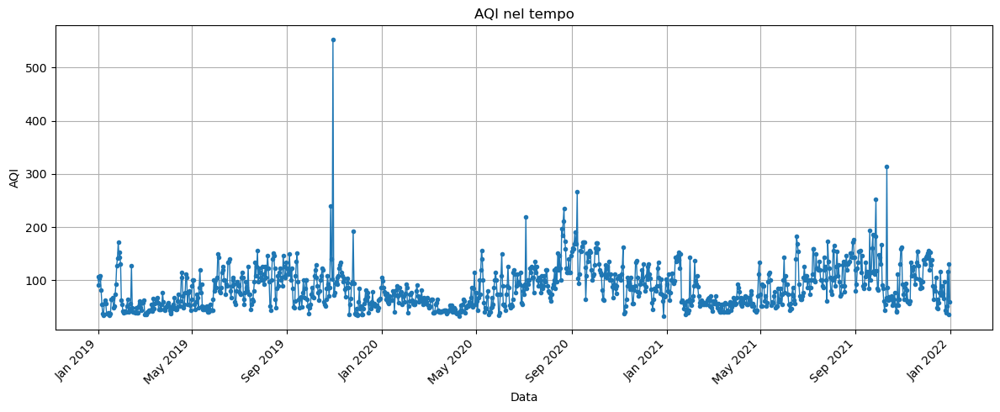

In [31]:

df=df_finale.copy()
fig, ax = plt.subplots(figsize=(12,5))
ax.plot(df.index, df["AQI"], marker='o', markersize=3, linewidth=1)

# formattazione date
ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))  # es: "Jan 2021"

plt.xticks(rotation=45, ha="right")
ax.set_xlabel("Data")
ax.set_ylabel("AQI")
ax.set_title("AQI nel tempo")
ax.grid(True)
plt.tight_layout()
plt.show()

# Metodi statistici per l'identificazione degli outlier

* Lasciamo inizialmente da parte l'analisi e validazione stagionale e li testiamo sull'intero dataset

In [32]:
def iq_distance (df,variabile):
    Q1 =  df[variabile].quantile(0.25)
    Q2 = df[variabile].quantile(0.50)
    Q3 = df[variabile].quantile(0.75)
    print(f"25th Percentile (Q1) della variabile {variabile}: {Q1}")
    print(f"50th Percentile (Q2 - Median) della variabile {variabile} : {Q2}")
    print(f"75th Percentile (Q3) della variabile {variabile} : {Q3}")
    IQR = Q3 - Q1
    print(f"Interquartile della variabile {variabile}  Range (IQR): {IQR}")
    Lower_fence=Q1-(1.5*IQR)
    print(f"il lower fence della variabile {variabile}  è :{Lower_fence}")
    Upper_fence=Q3+(1.5*IQR)
    print(f"l' upper fence della variabile {variabile}  è :{Upper_fence}")

In [33]:
vars=['AQI','PM 10','PM 2.5','O3','NO2','NO','CO','SO2']
for var in vars:
    iq_distance(df,var)
    print("\n")

25th Percentile (Q1) della variabile AQI: 55.0
50th Percentile (Q2 - Median) della variabile AQI : 79.0
75th Percentile (Q3) della variabile AQI : 108.0
Interquartile della variabile AQI  Range (IQR): 53.0
il lower fence della variabile AQI  è :-24.5
l' upper fence della variabile AQI  è :187.5


25th Percentile (Q1) della variabile PM 10: 23.0
50th Percentile (Q2 - Median) della variabile PM 10 : 42.0
75th Percentile (Q3) della variabile PM 10 : 63.0
Interquartile della variabile PM 10  Range (IQR): 40.0
il lower fence della variabile PM 10  è :-37.0
l' upper fence della variabile PM 10  è :123.0


25th Percentile (Q1) della variabile PM 2.5: 7.7
50th Percentile (Q2 - Median) della variabile PM 2.5 : 11.0
75th Percentile (Q3) della variabile PM 2.5 : 19.5
Interquartile della variabile PM 2.5  Range (IQR): 11.8
il lower fence della variabile PM 2.5  è :-10.000000000000004
l' upper fence della variabile PM 2.5  è :37.2


25th Percentile (Q1) della variabile O3: 0.019882
50th Percentile 

Text(0.5, 1.0, 'Istogramma della variabile AQI')

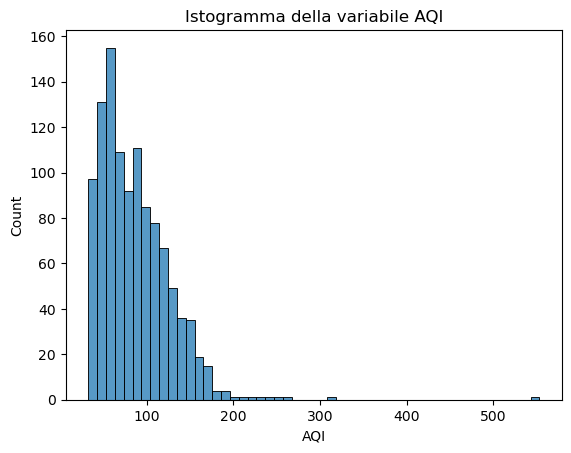

In [34]:
aqi_hist=sns.histplot(data=df_finale["AQI"])
aqi_hist.set_xlabel('AQI')
aqi_hist.set_title('Istogramma della variabile AQI')

# Outlier a livello globale

In [35]:
def boxplot (df,var):
    plt.figure(figsize=(6, 4))
    sns.boxplot(x=df[var])
    plt.title("Boxplot of {}".format(var))
    plt.xlabel(var)
    plt.grid(axis="x", alpha=0.3)
    plt.show()


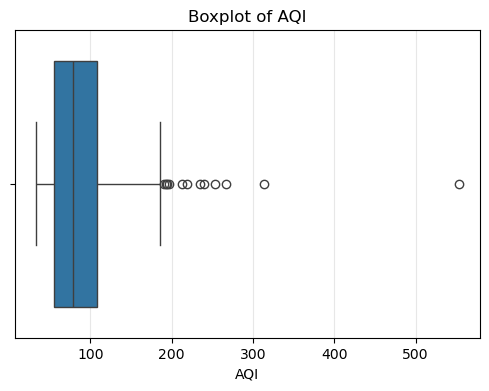

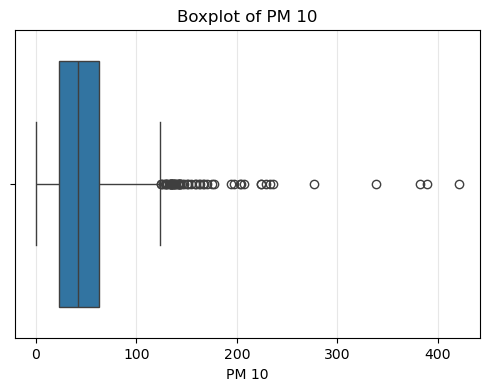

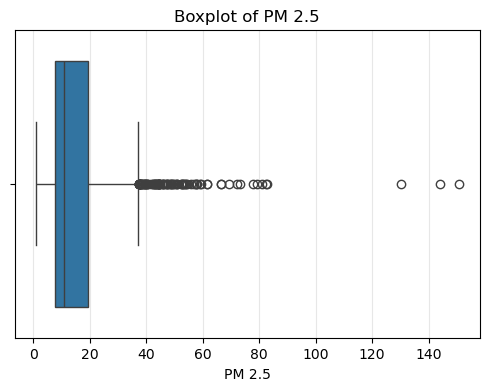

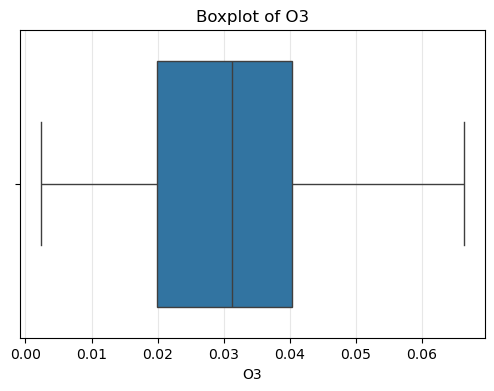

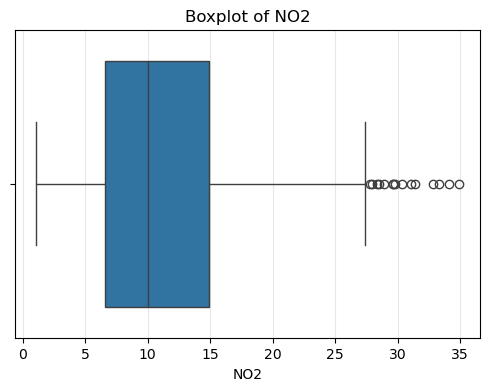

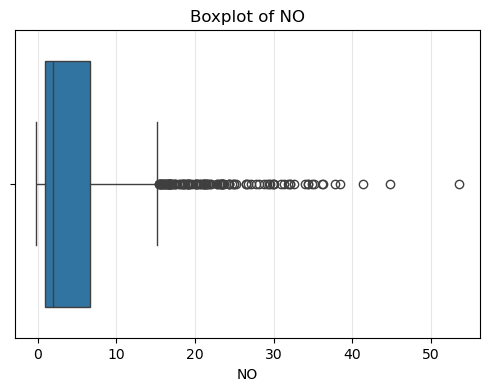

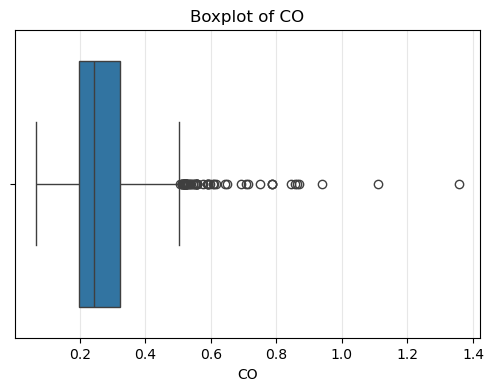

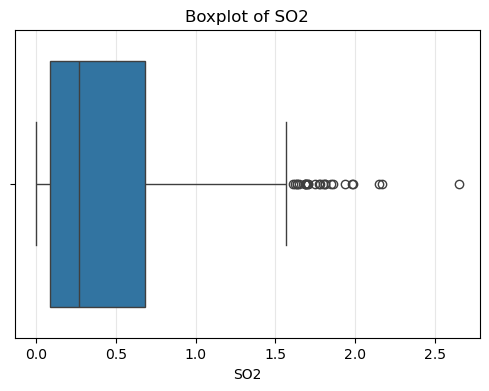

In [36]:
for var in vars:
    boxplot(df,var)
    print("\n")

In [37]:




def z_score(df, var, thresh=2.5):

    if var not in df.columns:
        raise KeyError(f"Colonna '{var}' non presente nel DataFrame.")

    s = df[var]

    print(f"\nVariabile: {var}")
    print(f"Totale righe: {len(s)}")
    print(f"Valori NaN: {s.isna().sum()}")

    mean = s.mean()
    std = s.std(ddof=0)

    print(f"Media: {mean}")
    print(f"Deviazione std: {std}")
    print(f"Soglia z-score: {thresh}")

    if pd.isna(std) or std == 0:
        print("Deviazione standard nulla o non valida → impossibile calcolare z-score")
        return

    # calcolo z-score
    z = (s - mean) / std

    # soglia per selezione degli outlier
    outliers = df[np.abs(z) > thresh].copy()
    outliers["z_score"] = z[np.abs(z) > thresh]

    if outliers.empty:
        print("Nessun outlier trovato con soglia 2.5")
    else:
        print(f"\nTrovati {len(outliers)} outlier:\n")
        print(outliers[[var, "z_score"]])



In [38]:
for var in vars:
    z_score(df,var)
    print("\n")


Variabile: AQI
Totale righe: 1096
Valori NaN: 0
Media: 86.31660583941606
Deviazione std: 39.93776108825395
Soglia z-score: 2.5

Trovati 12 outlier:

            AQI    z_score
2019-10-27  240   3.848072
2019-10-30  553  11.685267
2019-11-25  193   2.671241
2020-07-04  219   3.322254
2020-08-19  197   2.771397
2020-08-21  212   3.146981
2020-08-22  235   3.722878
2020-09-05  190   2.596124
2020-09-08  267   4.524124
2021-09-19  194   2.696280
2021-09-27  253   4.173579
2021-10-11  314   5.700955



Variabile: PM 10
Totale righe: 1096
Valori NaN: 53
Media: 49.90124640460211
Deviazione std: 43.00552739764333
Soglia z-score: 2.5

Trovati 24 outlier:

            PM 10   z_score
2019-02-13  207.0  3.652990
2019-09-07  197.0  3.420462
2019-10-09  162.0  2.606613
2019-10-27  382.0  7.722234
2019-10-28  233.0  4.257563
2019-10-29  158.0  2.513601
2019-10-30  389.0  7.885004
2019-11-25  339.0  6.722363
2020-08-21  203.0  3.559979
2020-08-22  229.0  4.164552
2020-09-08  236.0  4.327322
2020-09-

In [39]:



def z_robust(df, var, thresh=3):

    if var not in df.columns:
        raise KeyError(f"Colonna '{var}' non presente nel DataFrame.")

    s = df[var].dropna()

    median = s.median()
    mad = np.median(np.abs(s - median))

    print(f"\nVariabile: {var}")
    print(f"Mediana: {median}")
    print(f"MAD: {mad}")
    print(f"Soglia robust z: {thresh}")

    if mad == 0:
        print("MAD = 0 → impossibile calcolare z-robust")
        return

    z_robust = (s - median) / mad
   

    outliers = df.loc[s.index][np.abs(z_robust) > thresh].copy()
    outliers["z_robust"] = z_robust[np.abs(z_robust) > thresh]

    if outliers.empty:
        print("Nessun outlier trovato")
    else:
        print(f"\nTrovati {len(outliers)} outlier (robusti):\n")
        print(outliers[['AQI','z_robust']])     

In [40]:
for var in vars:
    z_robust(df,var)
    print("\n")


Variabile: AQI
Mediana: 79.0
MAD: 25.0
Soglia robust z: 3

Trovati 52 outlier (robusti):

            AQI  z_robust
2019-01-27  171      3.68
2019-07-25  156      3.08
2019-10-27  240      6.44
2019-10-30  553     18.96
2019-11-25  193      4.56
2020-05-08  156      3.08
2020-07-04  219      5.60
2020-08-19  197      4.72
2020-08-20  185      4.24
2020-08-21  212      5.32
2020-08-22  235      6.24
2020-08-23  174      3.80
2020-08-24  159      3.20
2020-09-02  161      3.28
2020-09-03  159      3.20
2020-09-04  169      3.60
2020-09-05  190      4.44
2020-09-06  172      3.72
2020-09-07  168      3.56
2020-09-08  267      7.52
2020-09-12  156      3.08
2020-09-14  164      3.40
2020-09-15  172      3.72
2020-09-16  172      3.72
2020-09-17  172      3.72
2020-09-24  156      3.08
2020-10-01  161      3.28
2020-10-03  170      3.64
2020-10-04  170      3.64
2020-10-05  159      3.20
2020-11-06  162      3.32
2021-06-17  182      4.12
2021-06-18  169      3.60
2021-07-08  159      3.20

In [41]:
def z_robust_return(df, var, thresh=3):

   
    s = df[var].dropna()

    median = s.median()
    mad = np.median(np.abs(s - median))

    

    z_robust = (s - median) / mad
   

    outliers = df.loc[s.index][np.abs(z_robust) > thresh].copy()
    outliers["z_robust"] = z_robust[np.abs(z_robust) > thresh]

  
    return(outliers[['AQI','z_robust']])     

In [42]:
out_z_robust=z_robust_return(df,'AQI')
print(out_z_robust)

            AQI  z_robust
2019-01-27  171      3.68
2019-07-25  156      3.08
2019-10-27  240      6.44
2019-10-30  553     18.96
2019-11-25  193      4.56
2020-05-08  156      3.08
2020-07-04  219      5.60
2020-08-19  197      4.72
2020-08-20  185      4.24
2020-08-21  212      5.32
2020-08-22  235      6.24
2020-08-23  174      3.80
2020-08-24  159      3.20
2020-09-02  161      3.28
2020-09-03  159      3.20
2020-09-04  169      3.60
2020-09-05  190      4.44
2020-09-06  172      3.72
2020-09-07  168      3.56
2020-09-08  267      7.52
2020-09-12  156      3.08
2020-09-14  164      3.40
2020-09-15  172      3.72
2020-09-16  172      3.72
2020-09-17  172      3.72
2020-09-24  156      3.08
2020-10-01  161      3.28
2020-10-03  170      3.64
2020-10-04  170      3.64
2020-10-05  159      3.20
2020-11-06  162      3.32
2021-06-17  182      4.12
2021-06-18  169      3.60
2021-07-08  159      3.20
2021-07-09  159      3.20
2021-07-27  174      3.80
2021-08-03  156      3.08
2021-08-04  

In [43]:
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.graphics.regressionplots import influence_plot
from statsmodels.tools.tools import add_constant


In [44]:
import scipy
def mahalanobis_dist_from_center(df):
    cov = df.cov().values
    inv_cov = np.linalg.inv(cov)
    mean = df.mean().values
    scores = []
    values = df.values
    for i in range(values.shape[0]):
        score = scipy.spatial.distance.mahalanobis(values[i],mean, inv_cov)
        scores.append(score)
    return pd.Series(data=scores, index=df.index)

In [45]:
df_small=df[['AQI','PM 10','PM 2.5','PM 10 STP','PM 10-2.5','AC PM 2.5']]
print(mahalanobis_dist_from_center(df_small))
#mah_d=mahalanobis_dist_from_center(df_small).to_numpy()
#mah_d
mahalanobis_dist_from_center(df_small).describe()

2019-01-01    2.642181
2019-01-02    2.176544
2019-01-03    2.640057
2019-01-04    3.325133
2019-01-05    5.016278
                ...   
2021-12-27    1.118083
2021-12-28    2.919383
2021-12-29    1.365334
2021-12-30    3.080478
2021-12-31    1.097549
Freq: D, Length: 1096, dtype: float64


count    932.000000
mean       2.150140
std        1.699230
min        0.644718
25%        1.280341
50%        1.634573
75%        2.422485
max       18.288336
dtype: float64

* **Teorema** : Il quadrato della **Mahalanobis Distance** segue una distribuzione Chi-quadro

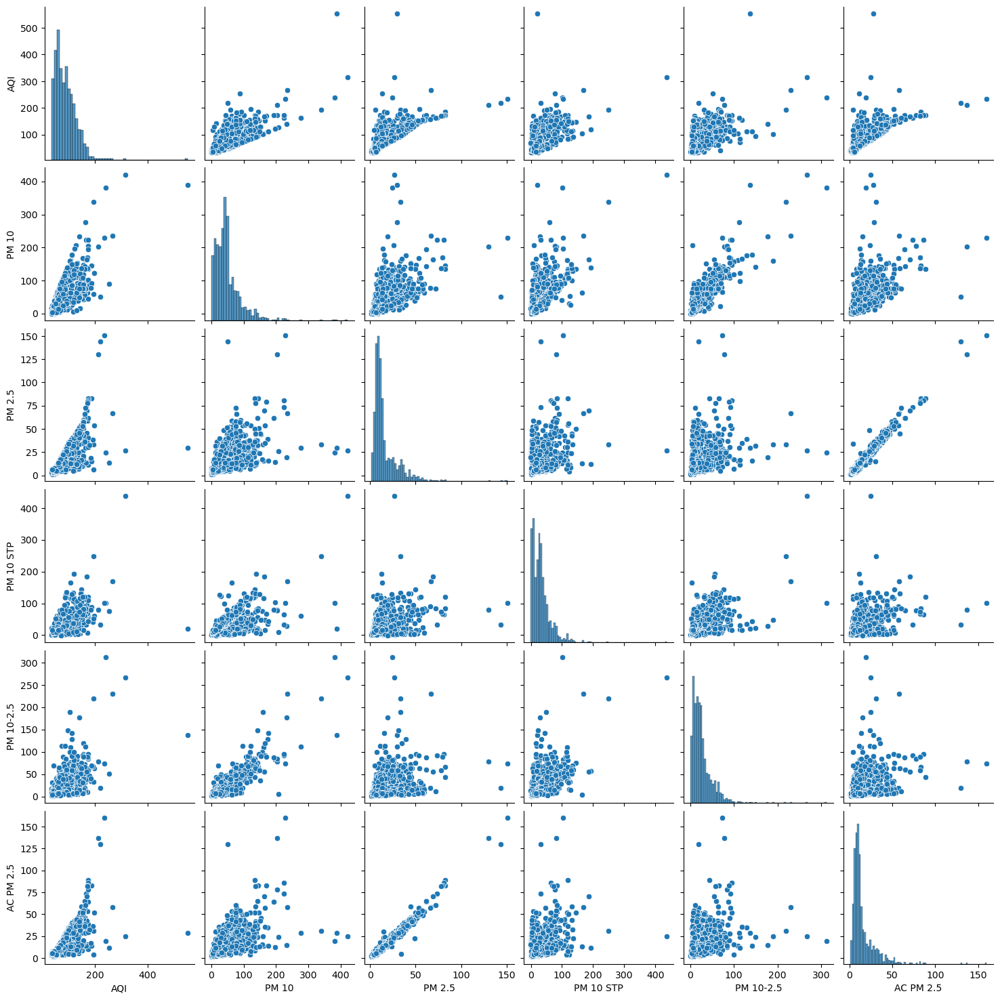

In [46]:
sns.pairplot(df_small)
plt.show()


Filtrando tengo 878 valori di distanze


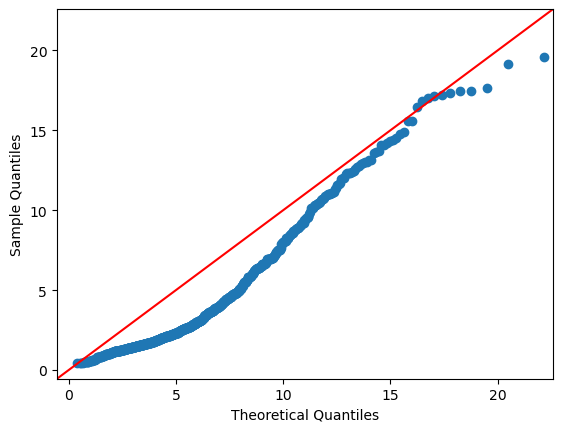

In [47]:
import seaborn as sns
from scipy.stats import chi2
k = df_small.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_small))
_dis_ = _dis_[_dis_ <= 20] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis_)} valori di distanze")
fig=sm.qqplot(_dis_,dist=chi2,distargs=(k,),line='45')
plt.show()

In [48]:
from scipy.stats import chi2
cutoff = chi2.ppf(0.95, df_small.shape[1])#il numero di gradi di libertà è il numero di variabili
cutoff_square_root= np.sqrt(cutoff)
print(f"L soglia di cutoff corrisponde a {cutoff_square_root}")
outliersIndexes = df_small.loc[mahalanobis_dist_from_center(df_small).index][mahalanobis_dist_from_center(df_small)>cutoff_square_root].copy()
outliersIndexes["mah_dist"]=mahalanobis_dist_from_center(df_small)[mahalanobis_dist_from_center(df_small)>cutoff_square_root]
print(f"\nTrovati {len(outliersIndexes)} outlier:\n")
print(outliersIndexes)

L soglia di cutoff corrisponde a 3.54846265920102

Trovati 86 outlier:

            AQI  PM 10  PM 2.5   PM 10 STP  PM 10-2.5  AC PM 2.5   mah_dist
2019-01-05   81   92.0    22.5    8.250000   8.745833  18.541667   5.016278
2019-01-25  128   62.0    46.4    8.708333  13.129167  38.583333   4.142437
2019-01-27  171   63.0    59.1    7.541667  10.262500  53.041667   4.148239
2019-01-29  152   77.0    57.6   24.833333  24.533333  50.916667   3.753611
2019-02-13  127  207.0    25.9    9.541667   5.629167  23.541667  11.983899
...         ...    ...     ...         ...        ...        ...        ...
2021-12-01  147  106.0    54.3  118.458333  33.933333  49.333333   4.427533
2021-12-03  151  109.0    55.9  120.208333  31.895833  50.291667   4.763645
2021-12-04  156   88.0    57.5   82.583333   8.883333  54.041667   4.099618
2021-12-06  152   76.0    52.6   65.166667   7.300000  51.666667   3.699738
2021-12-13  105   64.0    13.0  164.250000   4.291667  12.916667   6.284663

[86 rows x 7 co

In [49]:
cutoff_1 = chi2.ppf(0.99, df_small.shape[1])#il numero di gradi di libertà è il numero di variabili
cutoff1_square_root= np.sqrt(cutoff_1)
print(f"L soglia di cutoff più stringente corrisponde a {cutoff1_square_root}")
outliersIndexes1 = df_small.loc[mahalanobis_dist_from_center(df_small).index][mahalanobis_dist_from_center(df_small)>cutoff1_square_root].copy()
outliersIndexes1["mah_dist"]=mahalanobis_dist_from_center(df_small)[mahalanobis_dist_from_center(df_small)>cutoff1_square_root]
print(f"\nTrovati {len(outliersIndexes1)} outlier (robusti):\n")
print(outliersIndexes1)

L soglia di cutoff più stringente corrisponde a 4.100230948345584

Trovati 63 outlier (robusti):

            AQI  PM 10  PM 2.5   PM 10 STP  PM 10-2.5  AC PM 2.5   mah_dist
2019-01-05   81   92.0    22.5    8.250000   8.745833  18.541667   5.016278
2019-01-25  128   62.0    46.4    8.708333  13.129167  38.583333   4.142437
2019-01-27  171   63.0    59.1    7.541667  10.262500  53.041667   4.148239
2019-02-13  127  207.0    25.9    9.541667   5.629167  23.541667  11.983899
2019-09-07  122  197.0    13.9  103.333333  83.466667  11.958333   6.086747
...         ...    ...     ...         ...        ...        ...        ...
2021-11-19  154   90.0    59.5   83.695652  15.904348  52.458333   4.682224
2021-11-20  154   75.0    57.9   70.583333   7.200000  48.958333   5.289789
2021-12-01  147  106.0    54.3  118.458333  33.933333  49.333333   4.427533
2021-12-03  151  109.0    55.9  120.208333  31.895833  50.291667   4.763645
2021-12-13  105   64.0    13.0  164.250000   4.291667  12.916667  

In [50]:
regressori_small=df_small.columns.drop('AQI')
model_small=smf.ols('AQI~Q("PM 10")+Q("PM 2.5")',data=df_small)
regr_small=model_small.fit()
regr_small.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    AQI   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.601
Method:                 Least Squares   F-statistic:                     743.4
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          2.58e-197
Time:                        12:56:49   Log-Likelihood:                -4579.0
No. Observations:                 985   AIC:                             9164.
Df Residuals:                     982   BIC:                             9179.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      46.2619      1.315     35.168      0.000      43.680      48.843
Q("PM 10")      0.5203      0.022     23.995      0.000       0.478       0.563
Q("PM 2.5")     0.8560      0.064     13.479      0.000       0.731       0.981
==============================================================================
Omnibus:                      576.434   Durbin-Watson:                   1.010
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11927.243
Skew:                           2.256   Prob(JB):                         0.00
Kurtosis:                      19.439   Cond. No.                         112.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [51]:
influence = regr_small.get_influence()
cooks_d=influence.summary_frame()
cooks_df=cooks_d["cooks_d"].copy()
n = len(cooks_df)
th = 4.0 / n
influential = cooks_df[cooks_df > th]
print(influential)
print(f"Sono stati individuati {len(influential)} outliers")

2019-01-27    0.010520
2019-02-13    0.021121
2019-09-07    0.014177
2019-10-09    0.008272
2019-10-10    0.004784
2019-10-27    0.031520
2019-10-28    0.025876
2019-10-29    0.008338
2019-10-30    3.626160
2019-11-25    0.104623
2019-11-26    0.005665
2020-07-04    0.035535
2020-08-19    0.006947
2020-08-21    0.095608
2020-08-22    0.186801
2020-09-08    0.019736
2020-09-09    0.011644
2020-09-10    0.008234
2020-09-11    0.017853
2020-09-14    0.044983
2020-09-15    0.048852
2020-09-17    0.006155
2020-10-03    0.011361
2020-10-06    0.004422
2020-10-23    0.004332
2020-10-26    0.010879
2020-11-02    0.005568
2020-11-06    0.053021
2020-12-02    0.004152
2020-12-03    0.005351
2021-01-31    0.006213
2021-06-17    0.005617
2021-06-18    0.004398
2021-07-27    0.005255
2021-08-04    0.004210
2021-08-29    0.004163
2021-09-19    0.012403
2021-09-23    0.007722
2021-09-26    0.004858
2021-09-27    0.028226
2021-10-04    0.004405
2021-10-11    0.039717
2021-10-25    0.004138
2021-12-28 

C:\Users\tmart\AppData\Local\Temp\ipykernel_34232\1914117498.py:15: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(_1outliers.index, _1outliers.values,


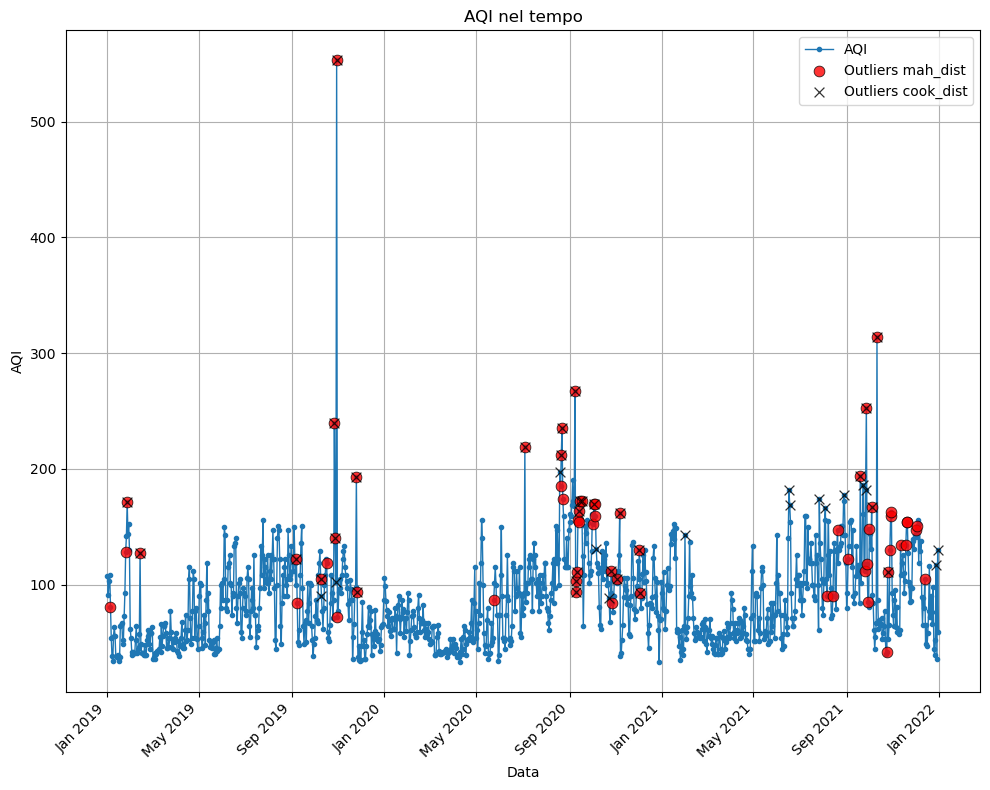

In [52]:
_outliers_ = df.loc[outliersIndexes1.index, "AQI"]

_1outliers=df.loc[influential.index, "AQI"]

fig, ax = plt.subplots(figsize=(10,8))

ax.plot(df.index, df["AQI"], marker='o', markersize=3, linewidth=1, label="AQI")

# outliers Mahalanobis (rosso)
ax.scatter(_outliers_.index, _outliers_.values,
           color='red', edgecolor='k', linewidth=0.6,
           alpha=0.8, s=60, label="Outliers mah_dist", zorder=5)

# outliers Cook (verde)
ax.scatter(_1outliers.index, _1outliers.values,
           color='black', edgecolor='k', linewidth=0.9,
           alpha=0.8, s=50, label="Outliers cook_dist", marker='x',zorder=6)

ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.xticks(rotation=45, ha="right")
ax.set_xlabel("Data"); ax.set_ylabel("AQI")
ax.set_title("AQI nel tempo")
ax.grid(True); ax.legend(); plt.tight_layout(); plt.show()





In [53]:
common_index = (
    outliersIndexes1.index
    .intersection(influential.index)
    .intersection(out_z_robust.index)
)

flagged_by_all_methods = df.loc[common_index, 'AQI']
print(flagged_by_all_methods)
print(f"Gli outliers identificati da tutti e tre i metodi sono {len(flagged_by_all_methods)}")

2019-01-27    171
2019-10-27    240
2019-10-30    553
2019-11-25    193
2020-07-04    219
2020-08-21    212
2020-08-22    235
2020-09-08    267
2020-09-14    164
2020-09-15    172
2020-09-17    172
2020-10-03    170
2020-11-06    162
2021-09-19    194
2021-09-27    253
2021-10-04    167
2021-10-11    314
Name: AQI, dtype: int64
Gli outliers identificati da tutti e tre i metodi sono 17


# Analisi stagionale

- Obiettivo dell'identificazione di outlier su base stagionale: attenuare la variabilità dei dati dovuta a pattern tipici di cascuna stagione.
- Obiettivo della procedura di validazione: Selezionare solamente le osservazioni caratterizzate da una forte evidenza statistica di anomalia

## Suddivisione stagionale

In [54]:
df_winter = df.loc[
    (df.index >= "2019-01-01") & (df.index <="2019-03-20" ) |
    (df.index >= "2019-12-21") & (df.index <= "2020-03-20") |
    (df.index >= "2020-12-21") & (df.index <= "2021-03-20") |
    (df.index >= "2021-12-21") & (df.index <= "2021-12-31")
,'AQI']
df_winter.describe()


count    271.000000
mean      66.630996
std       27.208734
min       33.000000
25%       48.000000
50%       60.000000
75%       75.000000
max      171.000000
Name: AQI, dtype: float64

In [55]:
df_spring= df.loc[
    (df.index >= "2019-03-21") & (df.index <= "2019-06-20") |
    (df.index >= "2020-03-21") & (df.index <= "2020-06-20") |
    (df.index >= "2021-03-21") & (df.index <= "2021-06-20")
,'AQI']
df_spring.describe()

count    276.000000
mean      69.597826
std       28.406424
min       33.000000
25%       49.750000
50%       59.000000
75%       84.750000
max      182.000000
Name: AQI, dtype: float64

In [56]:
df_summer= df.loc[
    (df.index >= "2019-06-21") & (df.index <= "2019-09-20") |
    (df.index >= "2020-06-21") & (df.index <= "2020-09-20") |
    (df.index >= "2021-06-21") & (df.index <= "2021-09-20")
,'AQI']
df_summer.describe()

count    276.000000
mean     110.684783
std       34.892853
min       44.000000
25%       90.000000
50%      105.000000
75%      126.000000
max      267.000000
Name: AQI, dtype: float64

In [57]:
df_autumn= df.loc[
    (df.index >= "2019-09-21") & (df.index <= "2019-12-20") |
    (df.index >= "2020-09-21") & (df.index <= "2020-12-20") |
    (df.index >= "2021-09-21") & (df.index <= "2021-12-20")
,'AQI']
df_autumn.describe()

count    273.000000
mean      98.124542
std       47.256410
min       34.000000
25%       67.000000
50%       93.000000
75%      119.000000
max      553.000000
Name: AQI, dtype: float64

## IQR distance

In [58]:
def iq_distance_seasonalAQI (df):
    a=np.zeros(6)
    Q1 =  df.quantile(0.25)
    Q2 = df.quantile(0.50)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1
    a[0]=Q1
    a[1]=Q2
    a[2]=Q3
    a[3]=IQR
    a[4]=Q1-(1.5*IQR)
    a[5]=Q3+(1.5*IQR)
    return(a)
   


In [59]:
print("Stagione invernale :\n")
print(f"25th Percentile (Q1) della variabile AQI : {iq_distance_seasonalAQI(df_winter)[0]}")
print(f"50th Percentile (Q2 - Median) della variabile AQI  : {iq_distance_seasonalAQI(df_winter)[1]}")
print(f"75th Percentile (Q3) della variabile AQI  : {iq_distance_seasonalAQI(df_winter)[2]}")
print(f"Interquartile  Range (IQR) di AQI: {iq_distance_seasonalAQI(df_winter)[3]}")
print(f"il lower fence della variabile AQI è :{iq_distance_seasonalAQI(df_winter)[4]}")
print(f"l' upper fence della variabile AQI   è :{iq_distance_seasonalAQI(df_winter)[5]}")

Stagione invernale :

25th Percentile (Q1) della variabile AQI : 48.0
50th Percentile (Q2 - Median) della variabile AQI  : 60.0
75th Percentile (Q3) della variabile AQI  : 75.0
Interquartile  Range (IQR) di AQI: 27.0
il lower fence della variabile AQI è :7.5
l' upper fence della variabile AQI   è :115.5


In [60]:
print("Stagione primaverile :\n")
print(f"25th Percentile (Q1) della variabile AQI : {iq_distance_seasonalAQI(df_spring)[0]}")
print(f"50th Percentile (Q2 - Median) della variabile AQI  : {iq_distance_seasonalAQI(df_spring)[1]}")
print(f"75th Percentile (Q3) della variabile AQI  : {iq_distance_seasonalAQI(df_spring)[2]}")
print(f"Interquartile  Range (IQR) di AQI: {iq_distance_seasonalAQI(df_spring)[3]}")
print(f"il lower fence della variabile AQI è :{iq_distance_seasonalAQI(df_spring)[4]}")
print(f"l' upper fence della variabile AQI   è :{iq_distance_seasonalAQI(df_spring)[5]}")

Stagione primaverile :

25th Percentile (Q1) della variabile AQI : 49.75
50th Percentile (Q2 - Median) della variabile AQI  : 59.0
75th Percentile (Q3) della variabile AQI  : 84.75
Interquartile  Range (IQR) di AQI: 35.0
il lower fence della variabile AQI è :-2.75
l' upper fence della variabile AQI   è :137.25


In [61]:
print("Stagione estiva :\n")
print(f"25th Percentile (Q1) della variabile AQI : {iq_distance_seasonalAQI(df_summer)[0]}")
print(f"50th Percentile (Q2 - Median) della variabile AQI  : {iq_distance_seasonalAQI(df_summer)[1]}")
print(f"75th Percentile (Q3) della variabile AQI  : {iq_distance_seasonalAQI(df_summer)[2]}")
print(f"Interquartile  Range (IQR) di AQI: {iq_distance_seasonalAQI(df_summer)[3]}")
print(f"il lower fence della variabile AQI è :{iq_distance_seasonalAQI(df_summer)[4]}")
print(f"l' upper fence della variabile AQI   è :{iq_distance_seasonalAQI(df_summer)[5]}")

Stagione estiva :

25th Percentile (Q1) della variabile AQI : 90.0
50th Percentile (Q2 - Median) della variabile AQI  : 105.0
75th Percentile (Q3) della variabile AQI  : 126.0
Interquartile  Range (IQR) di AQI: 36.0
il lower fence della variabile AQI è :36.0
l' upper fence della variabile AQI   è :180.0


In [62]:
print("Stagione autunnale :\n")
print(f"25th Percentile (Q1) della variabile AQI : {iq_distance_seasonalAQI(df_autumn)[0]}")
print(f"50th Percentile (Q2 - Median) della variabile AQI  : {iq_distance_seasonalAQI(df_autumn)[1]}")
print(f"75th Percentile (Q3) della variabile AQI  : {iq_distance_seasonalAQI(df_autumn)[2]}")
print(f"Interquartile  Range (IQR) di AQI: {iq_distance_seasonalAQI(df_autumn)[3]}")
print(f"il lower fence della variabile AQI è :{iq_distance_seasonalAQI(df_autumn)[4]}")
print(f"l' upper fence della variabile AQI   è :{iq_distance_seasonalAQI(df_autumn)[5]}")

Stagione autunnale :

25th Percentile (Q1) della variabile AQI : 67.0
50th Percentile (Q2 - Median) della variabile AQI  : 93.0
75th Percentile (Q3) della variabile AQI  : 119.0
Interquartile  Range (IQR) di AQI: 52.0
il lower fence della variabile AQI è :-11.0
l' upper fence della variabile AQI   è :197.0


In [63]:
outliers_iqr_inv=df_winter[(df_winter <= iq_distance_seasonalAQI(df_winter)[4]) | (df_winter >= iq_distance_seasonalAQI(df_winter)[5])]
print(f"Il metodo basato sulla distanza interquartile ricava {len(outliers_iqr_inv)} outlier per la variabile AQI nella stagione invernale: \n")
print(outliers_iqr_inv)

Il metodo basato sulla distanza interquartile ricava 20 outlier per la variabile AQI nella stagione invernale: 

2019-01-25    128
2019-01-26    142
2019-01-27    171
2019-01-28    144
2019-01-29    152
2019-01-30    130
2019-02-13    127
2020-12-21    133
2021-01-12    144
2021-01-13    135
2021-01-14    143
2021-01-15    146
2021-01-16    152
2021-01-17    139
2021-01-18    123
2021-01-19    149
2021-01-31    143
2021-02-06    137
2021-12-28    117
2021-12-30    130
Name: AQI, dtype: int64


In [64]:
outliers_iqr_pri=df_spring[(df_spring <= iq_distance_seasonalAQI(df_spring)[4]) | (df_spring >= iq_distance_seasonalAQI(df_spring)[5])]
print(f"Il metodo basato sulla distanza interquartile ricava {len(outliers_iqr_pri)} outlier per la variabile AQI nella stagione primaverile: \n")
print(outliers_iqr_pri)

Il metodo basato sulla distanza interquartile ricava 11 outlier per la variabile AQI nella stagione primaverile: 

2019-06-04    150
2019-06-05    143
2019-06-19    140
2020-05-08    156
2020-05-09    140
2020-06-03    150
2021-06-01    143
2021-06-16    140
2021-06-17    182
2021-06-18    169
2021-06-19    154
Name: AQI, dtype: int64


In [65]:
outliers_iqr_est=df_summer[(df_summer <= iq_distance_seasonalAQI(df_summer)[4]) | (df_summer >= iq_distance_seasonalAQI(df_summer)[5])]
print(f"Il metodo basato sulla distanza interquartile ricava {len(outliers_iqr_est)} outlier per la variabile AQI nella stagione estiva: \n")
print(outliers_iqr_est)

Il metodo basato sulla distanza interquartile ricava 8 outlier per la variabile AQI nella stagione estiva: 

2020-07-04    219
2020-08-19    197
2020-08-20    185
2020-08-21    212
2020-08-22    235
2020-09-05    190
2020-09-08    267
2021-09-19    194
Name: AQI, dtype: int64


In [66]:
outliers_iqr_aut=df_autumn[(df_autumn <= iq_distance_seasonalAQI(df_autumn)[4]) | (df_autumn >= iq_distance_seasonalAQI(df_autumn)[5])]
print(f"Il metodo basato sulla distanza interquartile ricava {len(outliers_iqr_aut)} outlier per la variabile AQI nella stagione autunnale: \n")
print(outliers_iqr_aut)

Il metodo basato sulla distanza interquartile ricava 4 outlier per la variabile AQI nella stagione autunnale: 

2019-10-27    240
2019-10-30    553
2021-09-27    253
2021-10-11    314
Name: AQI, dtype: int64


## Identificazione outliers basata su Mahalanobis distance

In [67]:
def DataFrameRestriction (df1,df2,vars):
  return df2.loc[df1.index, vars]


In [68]:
vars=['AQI','PM 10','PM 2.5']
df_winter_restr=DataFrameRestriction(df_winter,df,vars)
df_spring_restr=DataFrameRestriction(df_spring,df,vars)
df_summer_restr=DataFrameRestriction(df_summer,df,vars)
df_autumn_restr=DataFrameRestriction(df_autumn,df,vars)

* Osserviamo empiricamente, tramite il qq-plot, la non normalità della distribuzione delle distanze di mah.

Filtrando tengo 244 valori di distanze su 249 valori per cui è stata computata la distanza e 271 totali


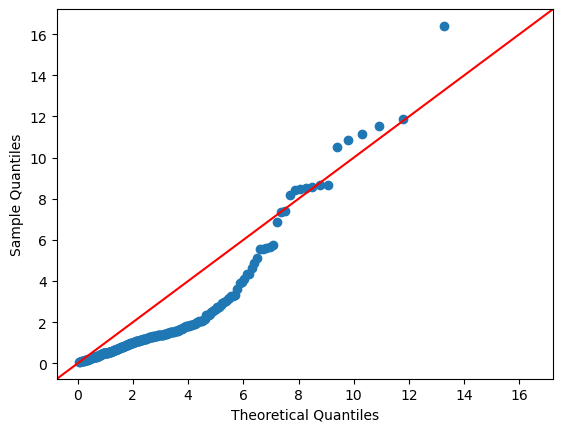

In [69]:
k = df_winter_restr.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_winter_restr))
_dis__ = _dis_[_dis_ <= 40] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

Filtrando tengo 244 valori di distanze su 251 valori per cui è stata computata la distanza e 276 totali


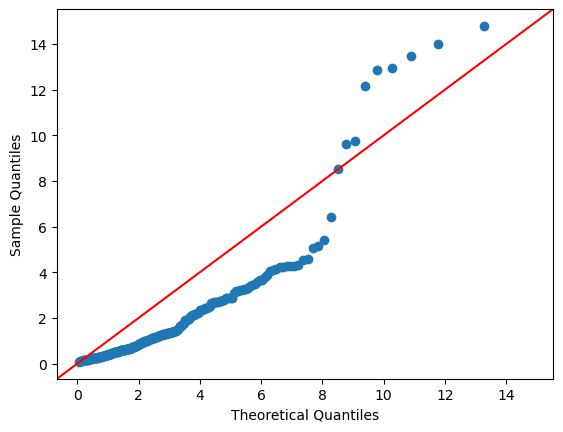

In [70]:
k = df_summer_restr.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_summer_restr))
_dis__ = _dis_[_dis_ <= 20] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

Filtrando tengo 232 valori di distanze su 233 valori per cui è stata computata la distanza e 276 totali


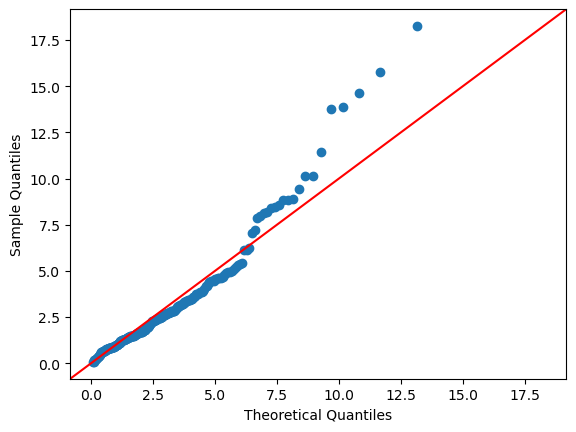

In [71]:
k = df_spring_restr.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_spring_restr))
_dis__ = _dis_[_dis_ <= 20] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

Filtrando tengo 247 valori di distanze su 252 valori per cui è stata computata la distanza e 273 totali


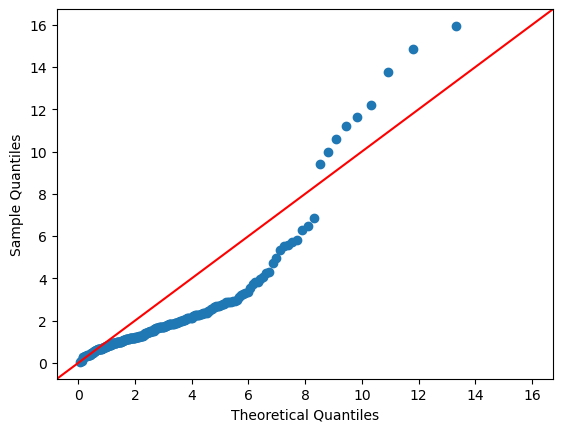

In [72]:
k = df_autumn_restr.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_autumn_restr))
_dis__ = _dis_[_dis_ <= 20] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

In [73]:
from scipy import stats

* Applichiamo la trasformazione Yeo-Jhonson per "correggere" la distribuzione delle distanze

In [74]:
from sklearn.preprocessing import PowerTransformer
df_winter_restr_=df_winter_restr.copy()
pt = PowerTransformer(method='yeo-johnson')
df_winter_restr_ = pt.fit_transform(df_winter_restr_)
df_winter_restr_=pd.DataFrame(df_winter_restr_,index=df_winter_restr.index, 
                                columns=df_winter_restr.columns)
print(df_winter_restr_)
df_winter_restr_.describe()





                 AQI     PM 10    PM 2.5
2019-01-01  1.430379  0.310638  1.494474
2019-01-02  1.096335  0.887842  1.208462
2019-01-03  1.355397  1.268022  1.437567
2019-01-04  1.448365  1.268022  1.512979
2019-01-05  0.830091  2.074895  0.779071
...              ...       ...       ...
2021-12-27 -0.421931 -1.451103 -1.102179
2021-12-28  1.598056 -1.289929 -1.194307
2021-12-29 -1.817157 -1.451103 -0.802689
2021-12-30  1.781894 -0.803227 -0.064010
2021-12-31 -0.022640 -0.377026  0.106948

[271 rows x 3 columns]


,AQI,PM 10,PM 2.5
count,2.710000e+02,2.680000e+02,2.520000e+02
mean,4.090209e-15,3.844354e-16,-1.762259e-16
std,1.001850e+00,1.001871e+00,1.001990e+00
min,-2.204969e+00,-2.630517e+00,-2.486448e+00
25%,-6.947677e-01,-7.063549e-01,-7.198599e-01
50%,2.776206e-02,5.963010e-03,-2.207321e-02
75%,6.406059e-01,7.255235e-01,7.068941e-01
max,2.197281e+00,3.502358e+00,2.133670e+00


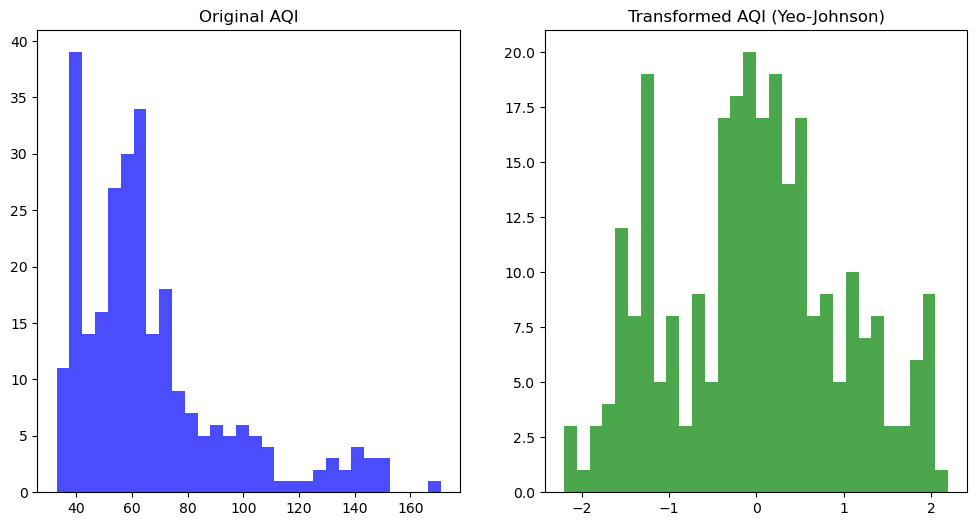

In [75]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df_winter_restr["AQI"], bins=30, color='blue', alpha=0.7)
plt.title('Original AQI')

plt.subplot(1, 2, 2)
plt.hist(df_winter_restr_["AQI"], bins=30, color='green', alpha=0.7)
plt.title('Transformed AQI (Yeo-Johnson)')

plt.show()

In [76]:
cutoff_1 = chi2.ppf(0.95, df_small.shape[1])#il numero di gradi di libertà è il numero di variabili
cutoff1_square_root= np.sqrt(cutoff_1)
print(f"L soglia di cutoff più stringente corrisponde a {cutoff1_square_root}")
outliers_mah_inv= df_winter_restr_.loc[mahalanobis_dist_from_center(df_winter_restr_).index][mahalanobis_dist_from_center(df_winter_restr_)>cutoff1_square_root].copy()
outliers_mah_inv["mah_dist"]=mahalanobis_dist_from_center(df_winter_restr_)[mahalanobis_dist_from_center(df_winter_restr_)>cutoff1_square_root]
print(f"\nTrovati {len(outliers_mah_inv)} outlier invernali (robusti) con il metodo basato su Mah. distance :\n")
print(outliers_mah_inv)

L soglia di cutoff più stringente corrisponde a 3.54846265920102

Trovati 8 outlier invernali (robusti) con il metodo basato su Mah. distance :

                 AQI     PM 10    PM 2.5  mah_dist
2019-01-08 -2.069189 -0.452193 -0.876473  3.558286
2019-02-04 -1.186818 -1.870457 -2.486448  3.933618
2019-02-13  1.742400  3.502358  0.970096  4.552575
2019-03-13  0.302088 -0.305695 -1.267680  4.194578
2021-01-19  1.999299  2.367842  0.180902  5.605913
2021-01-31  1.936124 -0.305695  0.607643  4.055850
2021-12-28  1.598056 -1.289929 -1.194307  7.535504
2021-12-30  1.781894 -0.803227 -0.064010  5.249655


count    249.000000
mean       3.250797
std        5.112990
min        0.097743
25%        0.862071
50%        2.091123
75%        3.783866
max       56.783818
dtype: float64
Filtrando tengo 241 valori di distanze su 249 valori per cui è stata computata la distanza e 271 totali


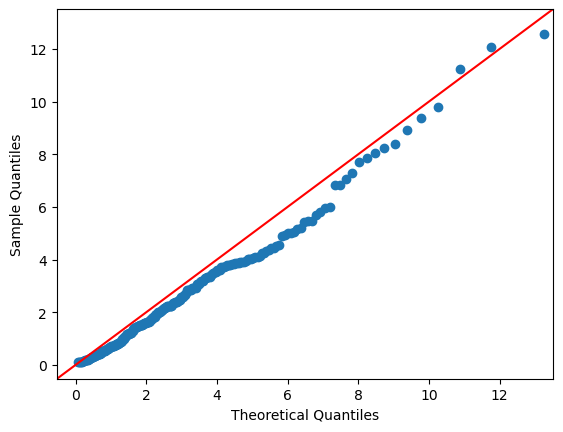

In [77]:
k = df_winter_restr_.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_winter_restr_))
print(_dis_.describe())
_dis__ = _dis_[_dis_ <= 12.65] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

In [78]:
df_spring_restr_=df_spring_restr.copy()
pt = PowerTransformer(method='yeo-johnson')
df_spring_restr_ = pt.fit_transform(df_spring_restr_)
df_spring_restr_=pd.DataFrame(df_spring_restr_,index=df_spring_restr.index, 
                                columns=df_spring_restr.columns)
print(df_spring_restr_)
df_spring_restr_.describe()

                 AQI     PM 10    PM 2.5
2019-03-21 -1.064935 -1.353150 -1.021317
2019-03-22 -0.415332 -0.743957  0.190134
2019-03-23 -0.981543 -1.140881  0.122260
2019-03-24 -0.415332 -0.938489  1.043439
2019-03-25  0.606814 -0.137221  1.265124
...              ...       ...       ...
2021-06-16  1.785144  1.752672  1.233640
2021-06-17  2.146066  2.553373  2.830501
2021-06-18  2.051870  2.181880  1.943454
2021-06-19  1.925327  0.532238  1.233640
2021-06-20  1.042454 -0.433645 -0.014582

[276 rows x 3 columns]


,AQI,PM 10,PM 2.5
count,2.760000e+02,2.540000e+02,2.550000e+02
mean,-4.582486e-15,1.398706e-16,-3.901019e-16
std,1.001817e+00,1.001974e+00,1.001967e+00
min,-2.409672e+00,-2.324471e+00,-2.666690e+00
25%,-6.960107e-01,-7.281199e-01,-6.144134e-01
50%,-1.323325e-01,1.480599e-01,-1.458241e-02
75%,8.359488e-01,6.922586e-01,6.722255e-01
max,2.146066e+00,2.826504e+00,2.974684e+00


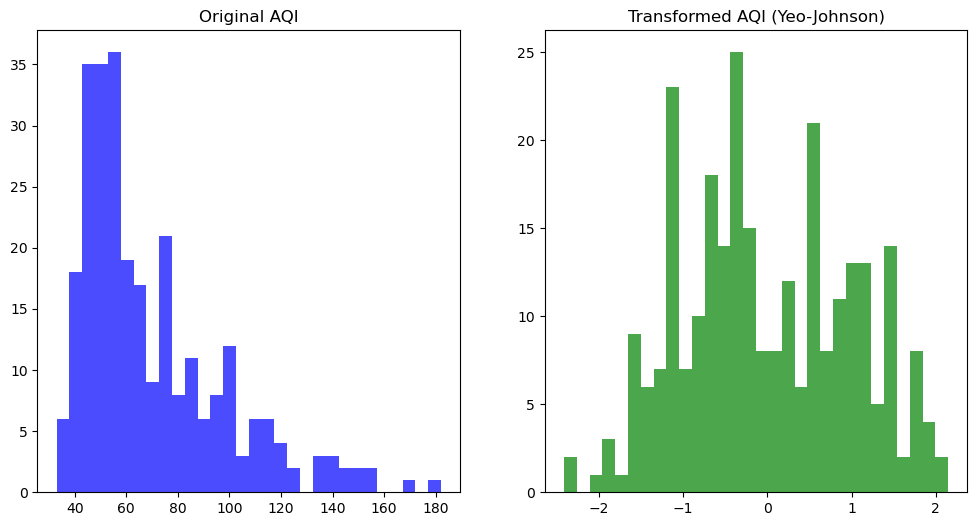

In [79]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df_spring_restr["AQI"], bins=30, color='blue', alpha=0.7)
plt.title('Original AQI')

plt.subplot(1, 2, 2)
plt.hist(df_spring_restr_["AQI"], bins=30, color='green', alpha=0.7)
plt.title('Transformed AQI (Yeo-Johnson)')

plt.show()

In [80]:
outliers_mah_pri= df_spring_restr_.loc[mahalanobis_dist_from_center(df_spring_restr_).index][mahalanobis_dist_from_center(df_spring_restr_)>cutoff1_square_root].copy()
outliers_mah_pri["mah_dist"]=mahalanobis_dist_from_center(df_spring_restr_)[mahalanobis_dist_from_center(df_spring_restr_)>cutoff1_square_root]
print(f"\nTrovati {len(outliers_mah_pri)} outlier primaverili (robusti) con il metodo basato su Mah. distance:\n")
print(outliers_mah_pri)


Trovati 2 outlier primaverili (robusti) con il metodo basato su Mah. distance:

                 AQI     PM 10    PM 2.5  mah_dist
2019-04-09  0.281437  2.826504 -0.506206  4.589453
2021-05-20  0.669967  2.644914 -0.152954  3.873270


count    233.000000
mean       2.989531
std        2.566674
min        0.021657
25%        1.325161
50%        2.417699
75%        3.749422
max       21.063083
dtype: float64
Filtrando tengo 231 valori di distanze su 233 valori per cui è stata computata la distanza e 276 totali


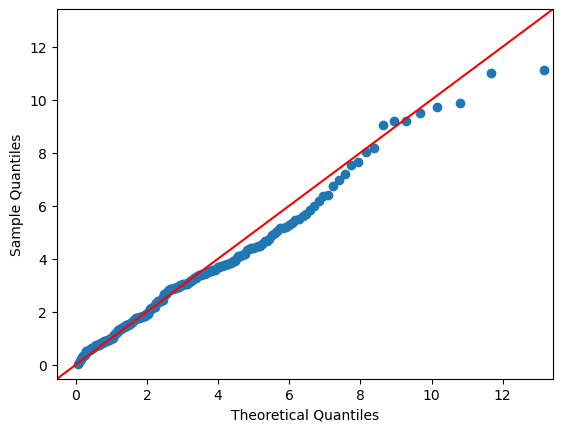

In [81]:
k = df_spring_restr_.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_spring_restr_))
print(_dis_.describe())
_dis__ = _dis_[_dis_ <= 14.8] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

In [82]:
df_summer_restr_=df_summer_restr.copy()
pt = PowerTransformer(method='yeo-johnson')
df_summer_restr_ = pt.fit_transform(df_summer_restr_)
df_summer_restr_=pd.DataFrame(df_summer_restr_,index=df_summer_restr.index, 
                                columns=df_summer_restr.columns)
print(df_summer_restr_)
df_summer_restr_.describe()

                 AQI     PM 10    PM 2.5
2019-06-21 -1.394929 -1.554056 -1.909601
2019-06-22 -0.528351 -0.850542 -1.009290
2019-06-23 -0.172248 -1.945193 -0.798191
2019-06-24 -0.050018 -1.122509 -0.641128
2019-06-25 -0.428113 -0.001168 -0.249769
...              ...       ...       ...
2021-09-16  0.296726  1.068211  0.251709
2021-09-17  0.155675  1.047137  0.205311
2021-09-18 -0.736636  0.781066  0.220990
2021-09-19  2.043770  0.274153 -1.737015
2021-09-20 -0.172248  0.467264  0.366664

[276 rows x 3 columns]


,AQI,PM 10,PM 2.5
count,2.760000e+02,2.610000e+02,2.650000e+02
mean,2.574430e-17,7.840472e-15,-1.930531e-15
std,1.001817e+00,1.001921e+00,1.001892e+00
min,-2.524538e+00,-2.591314e+00,-3.578485e+00
25%,-5.283505e-01,-6.132322e-01,-5.540117e-01
50%,-5.001758e-02,-5.267163e-02,-9.915032e-02
75%,5.395269e-01,6.954490e-01,4.826165e-01
max,3.262510e+00,2.286620e+00,2.324878e+00


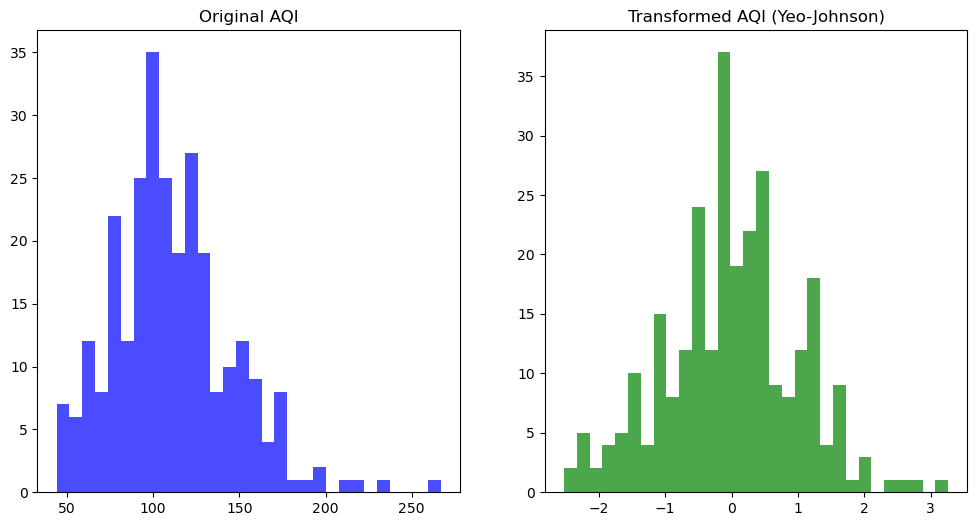

In [83]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df_summer_restr["AQI"], bins=30, color='blue', alpha=0.7)
plt.title('Original AQI')

plt.subplot(1, 2, 2)
plt.hist(df_summer_restr_["AQI"], bins=30, color='green', alpha=0.7)
plt.title('Transformed AQI (Yeo-Johnson)')

plt.show()

In [84]:
outliers_mah_est= df_summer_restr_.loc[mahalanobis_dist_from_center(df_summer_restr_).index][mahalanobis_dist_from_center(df_summer_restr_)>cutoff1_square_root].copy()
outliers_mah_est["mah_dist"]=mahalanobis_dist_from_center(df_summer_restr_)[mahalanobis_dist_from_center(df_summer_restr_)>cutoff1_square_root]
print(f"\nTrovati {len(outliers_mah_est)} outlier estivi (robusti) con il metodo basato su Mah. distance:\n")
print(outliers_mah_est)


Trovati 3 outlier estivi (robusti) con il metodo basato su Mah. distance:

                 AQI     PM 10    PM 2.5  mah_dist
2019-09-08 -0.736636 -1.945193 -3.578485  4.319288
2020-07-04  2.495290 -0.106015  2.313372  3.667366
2021-09-19  2.043770  0.274153 -1.737015  4.915778


count    251.000000
mean       2.915785
std        2.939700
min        0.039887
25%        0.957750
50%        1.979034
75%        3.955025
max       24.164873
dtype: float64
Filtrando tengo 248 valori di distanze su 251 valori per cui è stata computata la distanza e 276 totali


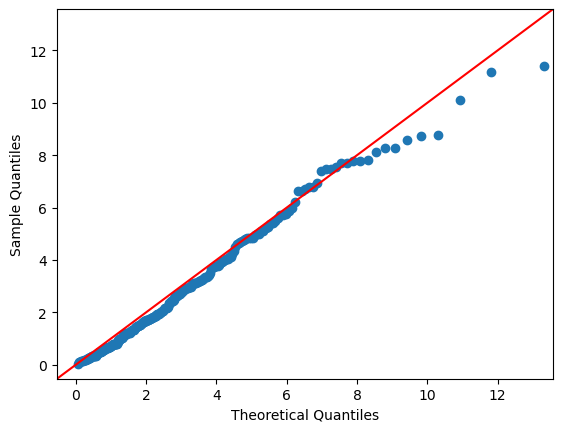

In [85]:
k = df_summer_restr_.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_summer_restr_))
print(_dis_.describe())
_dis__ = _dis_[_dis_ <= 13.3] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

In [86]:
df_autumn_restr_=df_autumn_restr.copy()
pt = PowerTransformer(method='yeo-johnson')
df_autumn_restr_ = pt.fit_transform(df_autumn_restr_)
df_autumn_restr_=pd.DataFrame(df_autumn_restr_,index=df_autumn_restr.index, 
                                columns=df_autumn_restr.columns)
print(df_autumn_restr_)
df_autumn_restr_.describe()

                 AQI     PM 10    PM 2.5
2019-09-21 -0.370745 -0.063236 -1.149809
2019-09-22  0.293169 -0.189479 -1.012365
2019-09-23 -0.715040  0.256077 -1.012365
2019-09-24 -0.156721  0.273405 -0.885025
2019-09-25  0.293169  0.407215 -0.777811
...              ...       ...       ...
2021-12-16 -1.603752 -2.174785 -1.765926
2021-12-17 -1.074724 -1.527144 -0.872786
2021-12-18 -0.370745 -1.285605  0.175314
2021-12-19  0.628039 -0.717408  0.703029
2021-12-20 -0.536589 -1.120800 -0.173608

[273 rows x 3 columns]


,AQI,PM 10,PM 2.5
count,2.730000e+02,2.600000e+02,2.640000e+02
mean,-1.327388e-15,-1.503071e-16,-1.049665e-15
std,1.001837e+00,1.001929e+00,1.001899e+00
min,-2.428186e+00,-2.584103e+00,-2.497337e+00
25%,-7.150403e-01,-6.594276e-01,-7.577032e-01
50%,9.231740e-02,6.484660e-02,5.357963e-02
75%,6.894892e-01,6.996306e-01,7.931830e-01
max,4.211419e+00,3.390092e+00,2.392568e+00


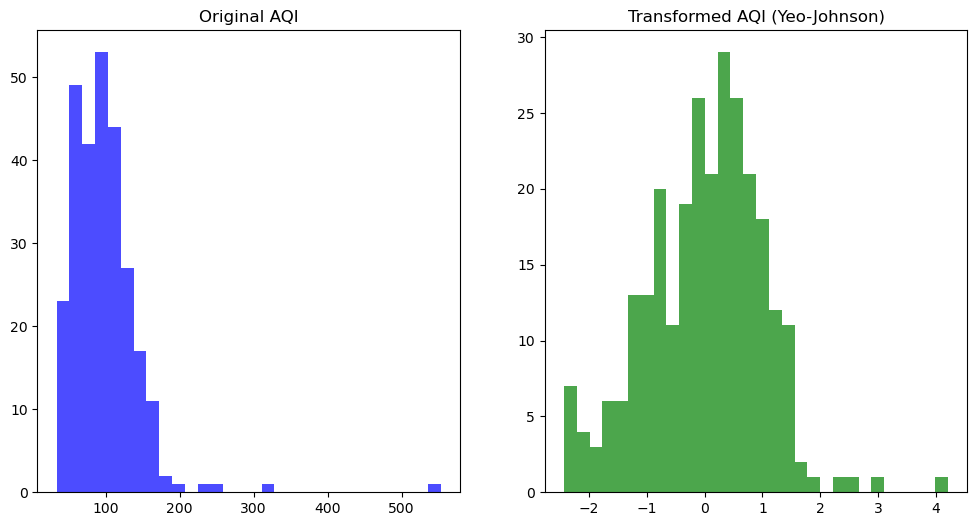

In [87]:
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(df_autumn_restr["AQI"], bins=30, color='blue', alpha=0.7)
plt.title('Original AQI')

plt.subplot(1, 2, 2)
plt.hist(df_autumn_restr_["AQI"], bins=30, color='green', alpha=0.7)
plt.title('Transformed AQI (Yeo-Johnson)')

plt.show()

In [88]:
outliers_mah_aut= df_autumn_restr_.loc[mahalanobis_dist_from_center(df_autumn_restr_).index][mahalanobis_dist_from_center(df_autumn_restr_)>cutoff1_square_root].copy()
outliers_mah_aut["mah_dist"]=mahalanobis_dist_from_center(df_autumn_restr_)[mahalanobis_dist_from_center(df_autumn_restr_)>cutoff1_square_root]
print(f"\nTrovati {len(outliers_mah_aut)} outlier autunnali (robusti) con il metodo basato su Mah. distance:\n")
print(outliers_mah_aut)


Trovati 6 outlier autunnali (robusti) con il metodo basato su Mah. distance:

                 AQI     PM 10    PM 2.5  mah_dist
2019-10-27  2.340773  3.154288  0.302996  3.641149
2019-10-30  4.211419  3.197724  0.598947  5.915784
2021-09-23  1.749118  0.486873 -0.422286  3.843199
2021-09-26  1.698213  0.256077 -0.148814  3.620818
2021-09-27  2.462022  0.439422 -0.633520  5.691872
2021-10-11  2.954236  3.390092  0.435186  4.202022


count    252.000000
mean       2.970378
std        3.564369
min        0.198028
25%        1.346460
50%        2.115200
75%        3.326826
max       34.996502
dtype: float64
Filtrando tengo 246 valori di distanze su 252 valori per cui è stata computata la distanza e 273 totali


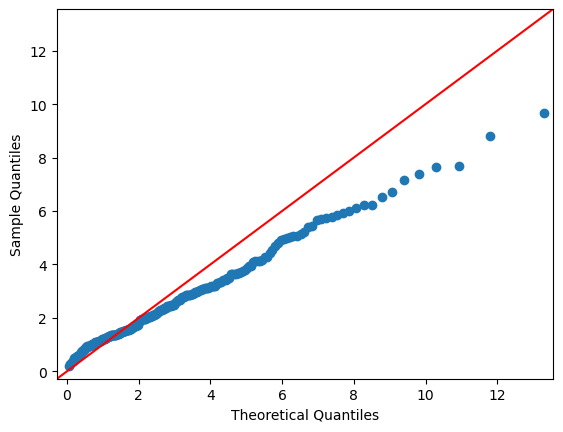

In [89]:
k = df_autumn_restr_.shape[1]   
_dis_=np.square(mahalanobis_dist_from_center(df_autumn_restr_))
print(_dis_.describe())
_dis__ = _dis_[_dis_ <= 13.1] # altrimeni gli outlier estremamente  sbilanciati si ripercuotono anche sulle distanze e a livello empirico verrebbe fortemente meno la validità del teorema   
print(f"Filtrando tengo {len(_dis__)} valori di distanze su {np.sum(~np.isnan(_dis_))} valori per cui è stata computata la distanza e {len(_dis_)} totali")
fig=sm.qqplot(_dis__,dist=chi2,distargs=(k,),line='45')
plt.show()

# QQ-plot → confronto tra la distribuzione del quadrato della distanza di Mahalanobis e la distribuzione χ²

Il dataframe contenente **AQI** e le variabili dei particolati (quelle più correlate ad AQI), dopo l’applicazione della trasformazione, mostra un comportamento molto più vicino a una **distribuzione gaussiana multivariata**.

## Diagnostica tramite QQ-plot
- Prima della trasformazione il QQ-plot falliva completamente, anche eliminando gli outlier individuati tramite la distanza di Mahalanobis (in alcuni casi abbiamo perfino rimosso più osservazioni del necessario).
- Dopo la trasformazione, i miglioramenti nel QQ-plot sono **notevoli**.
- Una volta rimossi i valori delle distanze associati agli outlier, la linearità attesa nel QQ-plot risulta soddisfacente.
- La normalizzazione è stata fondamentale affinché il criterio di individuazione degli outlier si basasse su solide ipotesi statistiche. Infatti ricordiamo il teorema:

## Teorema 
Se $\mathbf{X} \sim \mathcal{N}_n(\mu,\Sigma)$ $\Rightarrow
$ la distanza di Mahalanobis $ d^2 = (x-\mu)^\top \Sigma^{-1}(x-\mu)$ $\sim \chi^2_n $.

Di conseguenza, per determinare la soglia $q_p $ di confidenza a livello $\alpha$ tale che $P(d^2 < q_p) = \alpha$ , utilizziamo  $ q_p = \chi^2_{1-\alpha,n}$, dove $n$ è il numero di variabili considerate


## Nota importante sulla distanza di Mahalanobis
La distanza di Mahalanobis, prima e dopo la trasformazione, viene calcolata correttamente per **quasi tutte le osservazioni**, ma **non per tutte**.  
Le osservazioni per cui il calcolo non è possibile sono tipicamente quelle che presentano:

- valori mancanti prima e dopo la trasformazione,
- varianze troppo piccole o degenerazioni numeriche,
- problemi di invertibilità della matrice di covarianza.



# Identificazone outliers basata su z-score robusto

In [90]:
def seasonal_z_robust_outliers(serie, thresh=3):

   
    serie = serie.dropna()

    median = serie.median()
    mad = np.median(np.abs(serie - median))

    

    z_robust = (serie - median) / mad
    filtro = np.abs(z_robust) > thresh
   

    outliers = serie[filtro]
    out_z = z_robust[filtro] 
    outliers_ = pd.DataFrame({
        "AQI": outliers,
         "z_robust": out_z
    }, index=outliers.index)
  
    return(outliers_)     

In [91]:
outliers_zr_inv=seasonal_z_robust_outliers(df_winter, thresh=3)
print(f"Il metodo basato su z-robust ha ricavato {len(outliers_zr_inv)} outliers per la variabile AQI nella stagione invernale")
print(outliers_zr_inv)

Il metodo basato su z-robust ha ricavato 31 outliers per la variabile AQI nella stagione invernale
            AQI  z_robust
2019-01-01  107  3.615385
2019-01-03  103  3.307692
2019-01-04  108  3.692308
2019-01-25  128  5.230769
2019-01-26  142  6.307692
2019-01-27  171  8.538462
2019-01-28  144  6.461538
2019-01-29  152  7.076923
2019-01-30  130  5.384615
2019-02-13  127  5.153846
2020-01-01  106  3.538462
2020-12-21  133  5.615385
2020-12-22  106  3.538462
2020-12-25  102  3.230769
2020-12-31  102  3.230769
2021-01-03  111  3.923077
2021-01-07  100  3.076923
2021-01-08  114  4.153846
2021-01-12  144  6.461538
2021-01-13  135  5.769231
2021-01-14  143  6.384615
2021-01-15  146  6.615385
2021-01-16  152  7.076923
2021-01-17  139  6.076923
2021-01-18  123  4.846154
2021-01-19  149  6.846154
2021-01-31  143  6.384615
2021-02-06  137  5.923077
2021-02-09  108  3.692308
2021-12-28  117  4.384615
2021-12-30  130  5.384615


In [92]:
outliers_zr_pri=seasonal_z_robust_outliers(df_spring, thresh=3)
print(f"Il metodo basato su z-robust ha ricavato {len(outliers_zr_pri)} outliers per la variabile AQI nella stagione primaverile")
print(outliers_zr_pri)

Il metodo basato su z-robust ha ricavato 35 outliers per la variabile AQI nella stagione primaverile
            AQI  z_robust
2019-04-18  105  3.066667
2019-04-19  115  3.733333
2019-04-24  112  3.533333
2019-04-25  105  3.066667
2019-05-12  119  4.000000
2019-06-03  105  3.066667
2019-06-04  150  6.066667
2019-06-05  143  5.600000
2019-06-09  115  3.733333
2019-06-10  119  4.000000
2019-06-11  126  4.466667
2019-06-17  133  4.933333
2019-06-18  136  5.133333
2019-06-19  140  5.400000
2020-04-29  115  3.733333
2020-05-07  119  4.000000
2020-05-08  156  6.466667
2020-05-09  140  5.400000
2020-05-26  115  3.733333
2020-06-02  108  3.266667
2020-06-03  150  6.066667
2020-06-11  126  4.466667
2020-06-18  115  3.733333
2020-06-19  119  4.000000
2020-06-20  112  3.533333
2021-04-29  112  3.533333
2021-04-30  133  4.933333
2021-05-12  112  3.533333
2021-05-13  115  3.733333
2021-06-01  143  5.600000
2021-06-03  108  3.266667
2021-06-16  140  5.400000
2021-06-17  182  8.200000
2021-06-18  169

In [93]:
outliers_zr_est=seasonal_z_robust_outliers(df_summer, thresh=3)
print(f"Il metodo basato su z-robust ha ricavato {len(outliers_zr_est)} outliers per la variabile AQI nella stagione estiva")
print(outliers_zr_est)

Il metodo basato su z-robust ha ricavato 17 outliers per la variabile AQI nella stagione estiva
            AQI  z_robust
2020-07-04  219  5.428571
2020-08-19  197  4.380952
2020-08-20  185  3.809524
2020-08-21  212  5.095238
2020-08-22  235  6.190476
2020-08-23  174  3.285714
2020-09-04  169  3.047619
2020-09-05  190  4.047619
2020-09-06  172  3.190476
2020-09-08  267  7.714286
2020-09-15  172  3.190476
2020-09-16  172  3.190476
2020-09-17  172  3.190476
2021-07-27  174  3.285714
2021-08-28  172  3.190476
2021-08-29  177  3.428571
2021-09-19  194  4.238095


In [94]:
outliers_zr_aut=seasonal_z_robust_outliers(df_autumn, thresh=3)
print(f"Il metodo basato su z-robust ha ricavato {len(outliers_zr_aut)} outliers per la variabile AQI nella stagione autunnale")
print(outliers_zr_aut)

Il metodo basato su z-robust ha ricavato 7 outliers per la variabile AQI nella stagione autunnale
            AQI   z_robust
2019-10-27  240   5.653846
2019-10-30  553  17.692308
2019-11-25  193   3.846154
2021-09-23  186   3.576923
2021-09-26  182   3.423077
2021-09-27  253   6.153846
2021-10-11  314   8.500000


In [95]:
autumnOutliers_index = (
    outliers_zr_aut.index
    .intersection(outliers_mah_aut.index)
    .intersection(outliers_iqr_aut.index)
)

flagged_by_all_autumn = df.loc[autumnOutliers_index, 'AQI']
print(flagged_by_all_autumn)
print(f"Gli outliers identificati da tutti e tre i metodi per l'autunno sono {len(flagged_by_all_autumn)}")

2019-10-27    240
2019-10-30    553
2021-09-27    253
2021-10-11    314
Name: AQI, dtype: int64
Gli outliers identificati da tutti e tre i metodi per l'autunno sono 4


In [96]:
winterOutliers_index = (
    outliers_zr_inv.index
    .intersection(outliers_mah_inv.index)
    .intersection(outliers_iqr_inv.index)
)

flagged_by_all_winter = df.loc[winterOutliers_index, 'AQI']
print(flagged_by_all_winter)
print(f"Gli outliers identificati da tutti e tre i metodi per l'inverno sono {len(flagged_by_all_winter)}")

2019-02-13    127
2021-01-19    149
2021-01-31    143
2021-12-28    117
2021-12-30    130
Name: AQI, dtype: int64
Gli outliers identificati da tutti e tre i metodi per l'inverno sono 5


In [97]:
springOutliers_index = (
    outliers_zr_pri.index
    .intersection(outliers_mah_pri.index)
    .intersection(outliers_iqr_pri.index)
)

flagged_by_all_spring = df.loc[springOutliers_index, 'AQI']
print(flagged_by_all_spring)
print(f"Gli outliers identificati da tutti e tre i metodi per la primavera sono {len(flagged_by_all_spring)}")

Series([], Name: AQI, dtype: int64)
Gli outliers identificati da tutti e tre i metodi per la primavera sono 0


In [98]:
summerOutliers_index = (
    outliers_zr_est.index
    .intersection(outliers_mah_est.index)
    .intersection(outliers_iqr_est.index)
)

flagged_by_all_summer = df.loc[summerOutliers_index, 'AQI']
print(flagged_by_all_summer)
print(f"Gli outliers identificati da tutti e tre i metodi per l'estate sono {len(flagged_by_all_summer)}")

2020-07-04    219
2021-09-19    194
Name: AQI, dtype: int64
Gli outliers identificati da tutti e tre i metodi per l'estate sono 2


# Outlier finali

* Aggreghiamo gli indici dei vari outliers stagionali per ottenere quelli globali

In [99]:
Outliers_Indexes=summerOutliers_index.union(autumnOutliers_index).union(winterOutliers_index).union(springOutliers_index)


In [100]:
threshold_iqr_aut=iq_distance_seasonalAQI(df_autumn)[5]
threshold_iqr_inv=iq_distance_seasonalAQI(df_winter)[5]
threshold_iqr_pri=iq_distance_seasonalAQI(df_spring)[5]
threshold_iqr_est=iq_distance_seasonalAQI(df_summer)[5]

C:\Users\tmart\AppData\Local\Temp\ipykernel_34232\880521825.py:30: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  ax.scatter(final_outliers.index,final_outliers.values,


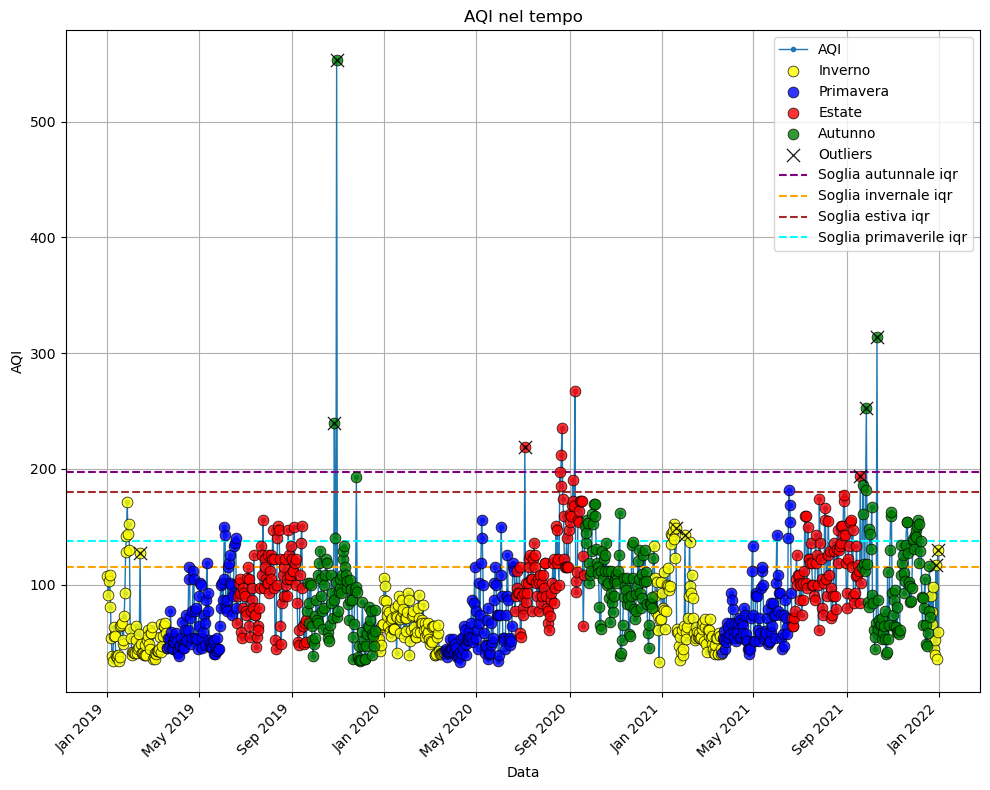

<Figure size 640x480 with 0 Axes>

In [101]:
inverno = df.loc[df_winter.index, "AQI"]
primavera=df.loc[df_spring.index, "AQI"]
estate=df.loc[df_summer.index, "AQI"]
autunno=df.loc[df_autumn.index,"AQI"]
final_outliers= df.loc[Outliers_Indexes, 'AQI']


fig, ax = plt.subplots(figsize=(10,8))

ax.plot(df.index, df["AQI"], marker='o', markersize=3, linewidth=1, label="AQI")


ax.scatter(inverno.index, inverno.values,
           color='yellow', edgecolor='k', linewidth=0.6,
           alpha=0.8, s=60, label="Inverno", zorder=5)


ax.scatter(primavera.index, primavera.values,
           color='blue', edgecolor='k', linewidth=0.6,
           alpha=0.8, s=60, label="Primavera", marker='o',zorder=5)

ax.scatter(estate.index, estate.values,
           color='red', edgecolor='k', linewidth=0.6,
           alpha=0.8, s=60, label="Estate", zorder=5)

ax.scatter(autunno.index, autunno.values,
           color='green', edgecolor='k', linewidth=0.6,
           alpha=0.8, s=60, label="Autunno", zorder=5)

ax.scatter(final_outliers.index,final_outliers.values,
          color='black',edgecolor='k', linewidth=0.9,
           alpha=0.9, s=90, label="Outliers", marker='x',zorder=5)
ax.axhline(threshold_iqr_aut, color='purple', linestyle='--', label='Soglia autunnale iqr')
ax.axhline(threshold_iqr_inv, color='orange', linestyle='--', label='Soglia invernale iqr')
ax.axhline(threshold_iqr_est, color='brown', linestyle='--', label='Soglia estiva iqr')
ax.axhline(threshold_iqr_pri, color='cyan', linestyle='--', label='Soglia primaverile iqr')


ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.xticks(rotation=45, ha="right")
ax.set_xlabel("Data"); ax.set_ylabel("AQI")
ax.set_title("AQI nel tempo")
ax.grid(True); ax.legend(); plt.tight_layout(); plt.show()
plt.savefig("plot.png",dpi=300,bbox_inches="tight")
plt.show()

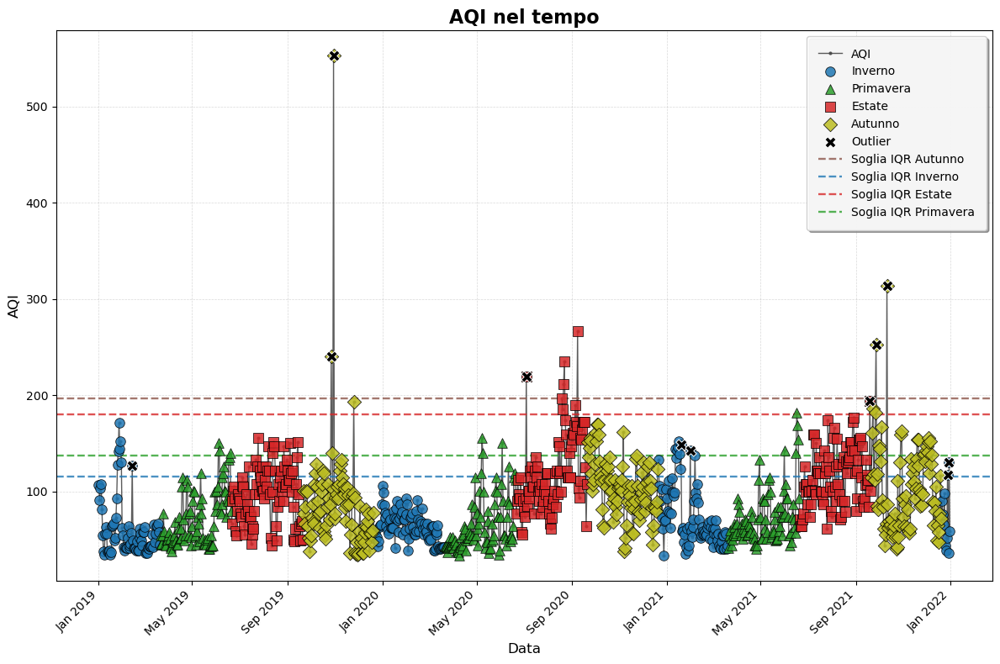

In [102]:

fig, ax = plt.subplots(figsize=(12, 8))


ax.plot(
    df.index, df["AQI"],
    marker='o', markersize=2, linewidth=1,
    color="#4a4a4a", alpha=0.9,
    label="AQI"
)


season_style = {
    "Inverno":   {"color": "#1f77b4", "marker": "o"},  # blu
    "Primavera": {"color": "#2ca02c", "marker": "^"},  # verde triangolo
    "Estate":    {"color": "#d62728", "marker": "s"},  # rosso quadrato
    "Autunno":   {"color": "#bcbd22", "marker": "D"},  # giallo oliva rombo
}

ax.scatter(
    inverno.index, inverno.values,
    color=season_style["Inverno"]["color"],
    edgecolor='black', linewidth=0.6,
    alpha=0.85, s=70, zorder=5,
    marker=season_style["Inverno"]["marker"],
    label="Inverno"
)

ax.scatter(
    primavera.index, primavera.values,
    color=season_style["Primavera"]["color"],
    edgecolor='black', linewidth=0.6,
    alpha=0.85, s=70, zorder=5,
    marker=season_style["Primavera"]["marker"],
    label="Primavera"
)

ax.scatter(
    estate.index, estate.values,
    color=season_style["Estate"]["color"],
    edgecolor='black', linewidth=0.6,
    alpha=0.85, s=70, zorder=5,
    marker=season_style["Estate"]["marker"],
    label="Estate"
)

ax.scatter(
    autunno.index, autunno.values,
    color=season_style["Autunno"]["color"],
    edgecolor='black', linewidth=0.6,
    alpha=0.85, s=70, zorder=5,
    marker=season_style["Autunno"]["marker"],
    label="Autunno"
)


ax.scatter(
    final_outliers.index, final_outliers.values,
    color='black', edgecolor='white',
    linewidth=0.7, alpha=1.0, s=90,
    marker='X', zorder=6,
    label="Outlier"
)


threshold_style = {
    "Autunno":    {"color": "#8c564b"},
    "Inverno":    {"color": "#1f77b4"},
    "Estate":     {"color": "#d62728"},
    "Primavera":  {"color": "#2ca02c"},
}

ax.axhline(threshold_iqr_aut, color=threshold_style["Autunno"]["color"],
           linestyle='--', linewidth=1.7, alpha=0.8, label="Soglia IQR Autunno")

ax.axhline(threshold_iqr_inv, color=threshold_style["Inverno"]["color"],
           linestyle='--', linewidth=1.7, alpha=0.8, label="Soglia IQR Inverno")

ax.axhline(threshold_iqr_est, color=threshold_style["Estate"]["color"],
           linestyle='--', linewidth=1.7, alpha=0.8, label="Soglia IQR Estate")

ax.axhline(threshold_iqr_pri, color=threshold_style["Primavera"]["color"],
           linestyle='--', linewidth=1.7, alpha=0.8, label="Soglia IQR Primavera")


ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter("%b %Y"))
plt.xticks(rotation=45, ha="right")


ax.set_xlabel("Data", fontsize=12)
ax.set_ylabel("AQI", fontsize=12)
ax.set_title("AQI nel tempo", fontsize=16, weight="bold")

ax.grid(True, which='major', linestyle='--', linewidth=0.5, color='gray', alpha=0.3)


ax.legend(
    frameon=True,
    framealpha=0.9,
    shadow=True,
    borderpad=1,
    fontsize=10,
)

plt.tight_layout()
plt.savefig("plot.png", dpi=300, bbox_inches="tight")
plt.show()

# Modelli di ML per la predizione di AQI

# Regressione lineare mantenendo gli outlier

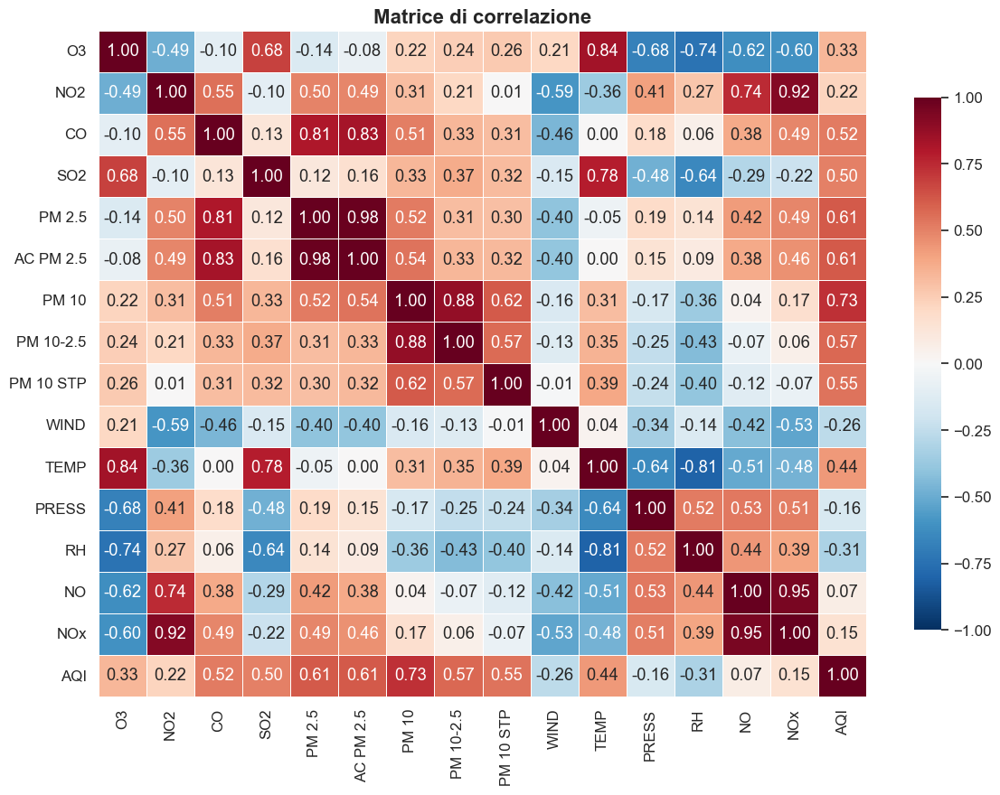

In [103]:
corr = df_finale.corr(numeric_only=True)


sns.set(style="white", font_scale=1.1)

plt.figure(figsize=(12, 9))


sns.heatmap(
    corr,
    cmap="RdBu_r",    
    annot=True,         
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1,
    cbar_kws={"shrink": .8}
)

plt.title("Matrice di correlazione", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

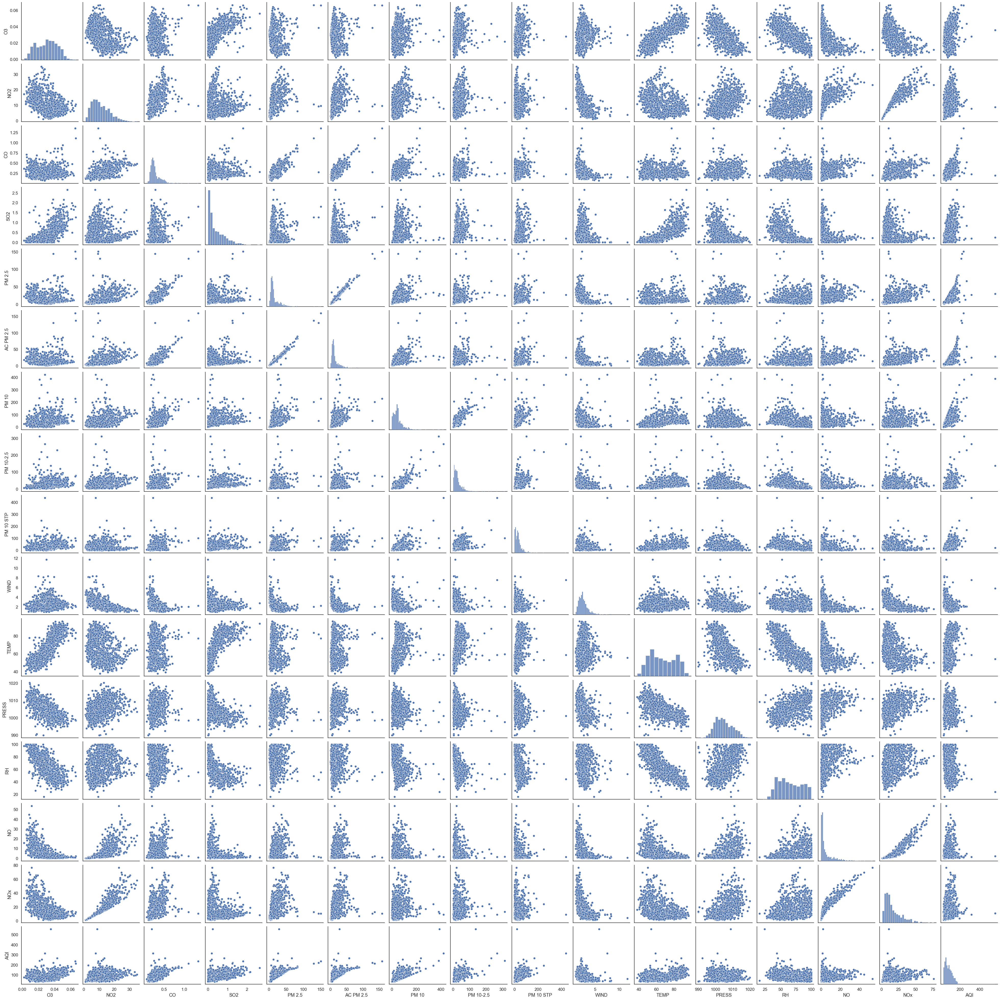

In [104]:
sns.pairplot(df_finale)
plt.show()

In [105]:
#import ISLP
import sklearn.model_selection as skm
#from ISLP import load_data , confusion_table
#from ISLP.models import ModelSpec as MS
from sklearn.model_selection import train_test_split

In [106]:
df = df.rename(columns={
    "PM 2.5": "PM2_5",
    "AC PM 2.5": "AC_PM2_5",
    "PM 10": "PM10",
    "PM 10-2.5": "PM10_2_5",
    "PM 10 STP": "PM10_STP"
})
#regressori=df.columns.drop(['AQI'])
#output="+".join(regressori)
#model=smf.ols(f"AQI~{output}",data=df)
#regr=model.fit()
#regr.summary()
#'AQI~Q("PM 10")+Q("PM 2.5")+Q("CO")+Q("NO2")+Q("O3")+Q("PM 10-2.5")+Q("SO2")+Q("TEMP")+Q("NOx")+Q("AC PM 2.5")+Q("PM 10 STP")+Q("NO")'

In [107]:
#model = MS(df.columns.drop('AQI'), intercept=False)
#D = model.fit_transform(df)
#feature_names = list(D.columns)
X = df.drop(columns=['AQI'])
y=df['AQI']
#print(y.index)
(X_train , X_test, y_train, y_test) = skm.train_test_split(X, y , test_size=0.3, random_state=0)
#print(y_test.index)

In [108]:
regressori=df.columns.drop(['AQI'])
df_train = pd.concat([X_train, y_train], axis=1)
#df_train['AQI'] = y_train.values

df_test =pd.concat([X_test, y_test], axis=1)
#df_test['AQI'] = y_test.values
formula = 'AQI ~ ' + ' + '.join(regressori)
model = smf.ols(formula=formula, data=df_train)
regr = model.fit()
print(regr.summary())

                            OLS Regression Results                            
Dep. Variable:                    AQI   R-squared:                       0.730
Model:                            OLS   Adj. R-squared:                  0.723
Method:                 Least Squares   F-statistic:                     98.64
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          1.93e-144
Time:                        12:57:23   Log-Likelihood:                -2536.7
No. Observations:                 562   AIC:                             5105.
Df Residuals:                     546   BIC:                             5175.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -418.2869    281.258     -1.487      0.1

In [109]:
#regressori=df.columns.drop(['AQI'])
#output="+".join(regressori)
#regr=model.fit()
#model=smf.ols(f"y_train~{X_train}", data=X_train)
#regr.summary()
#'AQI~Q("PM 10")+Q("PM 2.5")+Q("CO")+Q("NO2")+Q("O3")+Q("PM 10-2.5")+Q("SO2")+Q("TEMP")+Q("NOx")+Q("AC PM 2.5")+Q("PM 10 STP")+Q("NO")'

In [110]:
r2 = regr.rsquared_adj
print(f'R^2: {r2:.4}')

R^2: 0.723


In [111]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [112]:
df_test_clean=df_test.dropna()
#df_test_clean.describe()
#df_test_clean.reset_index

In [113]:
predictions = regr.predict(df_test_clean.drop(columns=['AQI']))
mse = mean_squared_error(df_test_clean['AQI'], predictions)
print(f'Il MSE di test è: {mse:.4f}')
r2 = r2_score(df_test_clean['AQI'], predictions)
print(f'R² di test: {r2:.4f}')

Il MSE di test è: 418.8447
R² di test: 0.7348


* Stampiamo anche gli outlier ricavai tramite il criterio basato su Cook's distance che però non abbiamo preso in considerazione per le nostre analisi

In [114]:
influence__ = regr.get_influence()
cooks__d=influence__.summary_frame()
cooks__df=cooks__d["cooks_d"].copy()
n = len(cooks__df)
th = 4.0 / n
influential__ = cooks__df[cooks__df > th]
print(influential__)
print(f"Sono stati individuati {len(influential__)} outliers")

2021-12-30    0.017222
2021-12-06    0.010473
2019-10-30    6.640922
2020-09-11    0.015530
2020-09-10    0.027953
2021-09-19    0.024612
2019-01-01    0.011070
2020-12-09    0.008013
2019-01-27    0.013902
2021-06-19    0.009977
2021-10-11    0.183770
2020-09-09    0.019451
2020-05-29    0.014584
2021-09-29    0.007930
2020-09-15    0.024746
2020-09-08    0.171982
2021-09-21    0.013222
2020-12-02    0.014676
2021-12-28    0.014358
2020-08-21    0.059432
2019-11-25    0.060267
2019-02-13    0.155463
2019-04-09    0.014703
2021-10-25    0.024220
2021-09-26    0.015527
2020-11-06    0.028043
2021-09-03    0.032106
2020-08-22    0.172533
Name: cooks_d, dtype: float64
Sono stati individuati 28 outliers


# Regressione lineare rimuovendo gli outlier

In [115]:
df_remove=df.drop(index=Outliers_Indexes)
df_remove

,O3,NO2,CO,SO2,PM2_5,AC_PM2_5,PM10,PM10_2_5,PM10_STP,WIND,TEMP,PRESS,RH,NO,NOx,AQI
2019-01-01,0.011176,15.900000,0.536522,0.058333,37.8,33.250000,26.0,9.291667,5.875000,1.862500,39.208333,1011.145833,83.958333,14.634783,30.482609,107
2019-01-02,0.010294,21.313043,0.488095,0.216667,30.8,26.375000,41.0,16.358333,12.250000,1.266667,41.545833,1012.600000,80.791667,28.139130,49.486957,91
2019-01-03,0.008706,24.652174,0.503043,0.191667,36.3,31.250000,54.0,14.683333,13.666667,1.808333,44.108333,1011.091667,78.625000,44.813043,69.495652,103
2019-01-04,0.009706,25.065217,0.522174,0.233333,38.3,31.750000,54.0,18.354167,11.250000,1.741667,48.545833,1004.195833,74.583333,41.373913,66.395652,108
2019-01-05,0.019824,16.695652,0.430455,0.070833,22.5,18.541667,92.0,8.745833,8.250000,3.041667,53.575000,1000.254167,78.625000,15.500000,32.208696,81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-25,0.027118,5.452174,0.226818,0.054167,7.9,7.458333,9.0,4.958333,12.041667,3.020833,49.900000,1004.370833,83.416667,1.778261,7.243478,44
2021-12-26,0.015765,11.682609,0.270909,0.041667,5.5,5.666667,5.0,4.829167,10.458333,2.504167,45.450000,1009.225000,81.125000,5.147826,16.808696,39
2021-12-27,0.018941,13.865217,0.201111,0.004167,4.9,4.125000,4.0,4.691667,10.583333,3.137500,44.608333,1005.091667,92.791667,5.273913,19.143478,52
2021-12-29,0.009471,16.765217,0.243043,0.000000,6.4,5.583333,4.0,3.360870,15.541667,2.183333,41.560000,999.908333,94.458333,7.521739,24.291304,36


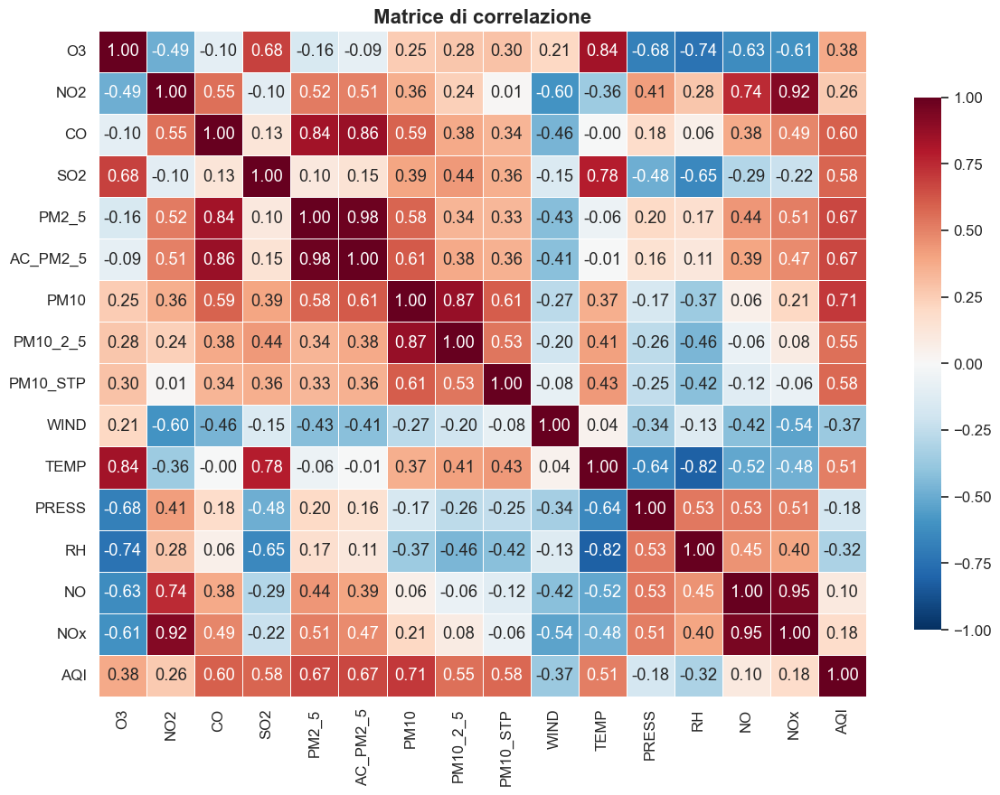

In [116]:
corr_ = df_remove.corr(numeric_only=True)


sns.set(style="white", font_scale=1.1)

plt.figure(figsize=(12, 9))


sns.heatmap(
    corr_,
    cmap="RdBu_r",    
    annot=True,         
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1,
    cbar_kws={"shrink": .8}
)

plt.title("Matrice di correlazione", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.show()

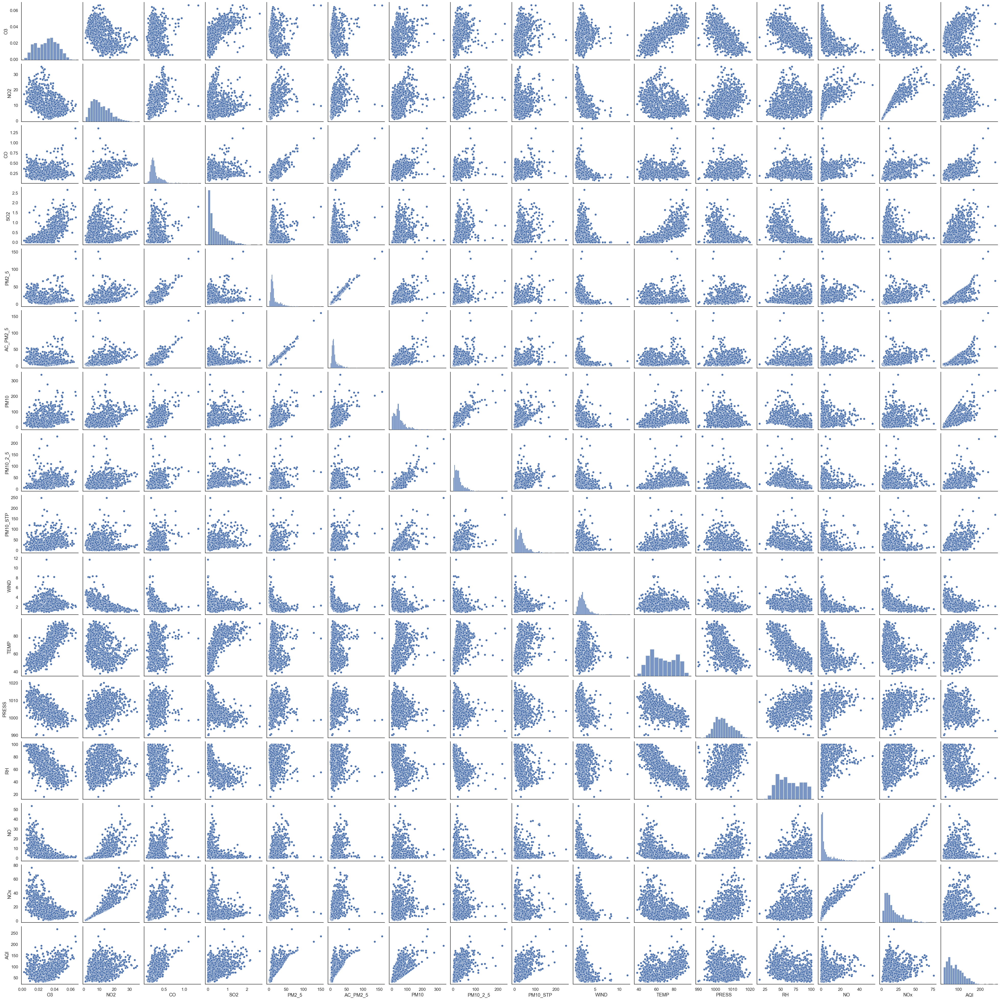

In [117]:
sns.pairplot(df_remove)
plt.show()

In [118]:
X = df_remove.drop(columns=['AQI'])
y=df_remove['AQI']
#print(y.index)
(X_train , X_test, y_train, y_test) = skm.train_test_split(X, y , test_size=0.3, random_state=0)
#print(y_test.index)

In [119]:
df_remove_train=pd.concat([X_train, y_train], axis=1)

In [120]:
regressori=df_remove.columns.drop(['AQI'])
formula = 'AQI ~ ' + ' + '.join(regressori)
model = smf.ols(formula=formula, data=df_remove_train)
regr = model.fit()
print(regr.summary())

                            OLS Regression Results                            
Dep. Variable:                    AQI   R-squared:                       0.834
Model:                            OLS   Adj. R-squared:                  0.829
Method:                 Least Squares   F-statistic:                     178.4
Date:                Sat, 27 Dec 2025   Prob (F-statistic):          2.92e-196
Time:                        12:57:53   Log-Likelihood:                -2266.9
No. Observations:                 548   AIC:                             4566.
Df Residuals:                     532   BIC:                             4635.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -288.4497    207.905     -1.387      0.1

In [121]:
r2 = regr.rsquared_adj
print(f'R^2 di training: {r2:.4}')

R^2 di training: 0.8295


In [122]:
X_test_clean=X_test.dropna()
y_test_clean=y_test.loc[X_test_clean.index]
predictions = regr.predict(X_test_clean)
mse = mean_squared_error(y_test_clean, predictions)
print(f'Il MSE di test è: {mse:.4f}')
r2 = r2_score(y_test_clean, predictions)
print(f'R² di test: {r2:.4f}')

Il MSE di test è: 262.0252
R² di test: 0.7837


In [123]:
df_ridge=df.copy()
dfRidge=df_ridge.dropna()
dfRidge.describe()

,O3,NO2,CO,SO2,PM2_5,AC_PM2_5,PM10,PM10_2_5,PM10_STP,WIND,TEMP,PRESS,RH,NO,NOx,AQI
count,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000,803.000000
mean,0.029753,11.622139,0.281544,0.398186,15.889166,15.361254,52.165629,28.718723,32.759280,2.553008,65.717622,1004.667175,64.603211,5.653021,17.275074,85.470735
std,0.012410,6.254832,0.130503,0.418535,14.597611,14.240265,46.668232,28.978336,32.633108,1.003746,14.173581,5.024875,18.974204,7.641825,12.926499,41.755942
min,0.002353,1.078261,0.066364,0.000000,1.000000,1.125000,0.000000,0.900000,-0.217391,0.966667,37.750000,989.962500,15.958333,-0.226087,1.147826,33.000000
25%,0.019529,6.851144,0.199315,0.079167,7.500000,7.416667,22.000000,10.781250,10.278080,1.833333,54.112500,1001.025000,48.541667,0.969565,8.032609,54.000000
50%,0.030706,10.391304,0.246364,0.243478,10.700000,10.791667,42.000000,21.004167,26.416667,2.391667,63.700000,1004.095833,62.625000,2.208696,13.069565,77.000000
75%,0.038816,15.665735,0.316957,0.616667,18.950000,17.957428,68.000000,36.964584,43.020833,2.991667,77.981250,1008.187500,81.291666,6.891403,23.043478,107.500000
max,0.066353,34.886957,1.356364,2.650000,150.700000,159.750000,421.000000,312.212500,437.208333,8.325000,96.558333,1020.116667,100.000000,53.526087,76.495652,553.000000


In [124]:
from matplotlib.pyplot import subplots
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
import sklearn.model_selection as skm
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Regressione Ridge

## Steps:
  - Suddivisione del dataset in Training e Test sets (il training set serve per ottenere la stima dei parametri ottimali $\hat{\beta}$, ovvero i          parameri del modello che minimizzano una certa funzione obiettivo) (il Test set serve per valuatare la performance in fase di predizione e capire se    il modello è in grado di generalizzare su dati non osservati)
  - Per regressione Ridge e Lasso (anche per i modelli ensamble), la funzione obiettivo dipende da iperparametri :
  - $$
\hat{\beta}
=
\arg\min_{\beta}
\left\{
\sum_{i=1}^{n}
\left(
y_{\text{train},i}
-
(X_{\text{train}}\beta)_i
\right)^2
+\lambda
\sum_{j=1}^{p}
\beta_j^2
\right\}
$$
  - Quindi, la `Grid Search` va ad individuare l'iperparametro ottimale seguendo il seguente procedimento :
 - vengono testati in modo esaustivo tutti i valori di $\lambda$ prefissati e viene scelto quello che alla fine ottiene la  migliore performance considerando $X_{\text{train}}$ :
- il dataset di training viene suddiviso in K sottoinsiemi (fold);

- per ciascun valore di $\lambda$, il modello viene addestrato K volte, utilizzando ogni volta K-1 fold come insieme di training e il fold rimanente come insieme di validazione;

- per ogni $\lambda$, le prestazioni del modello vengono valutate sul fold di validazione tramite una metrica prefissata e successivamente mediate sui K fold;

- il valore di $\lambda$ che massimizza (o minimizza, a seconda della metrica) la performance media viene selezionato come iperparametro ottimale;

- infine, il modello viene riaddestrato sull’intero insieme di training utilizzando il valore ottimale di $\lambda$.

In [125]:
y=dfRidge.AQI
X=dfRidge.drop(['AQI'],axis=1)

In [126]:
(X_train , X_test, y_train, y_test) = skm.train_test_split(X, y , test_size=0.3, random_state=0)

In [127]:
lambdas = 10**np.linspace(8, -2, 100) / y_train.std()

# Grid Search per ottimizzare il termine di penalizzazione $\lambda$

In [128]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

# definisco i parametri di input per la CV: nota il comando pipe per la standardizzazione sullo stimatore ridge
param_grid = {'ridge__alpha': lambdas}
scaler = StandardScaler(with_mean=True,  with_std=True)
ridge=Ridge()
pipe = Pipeline(steps=[('scaler', scaler), ('ridge', ridge)])

# CV: nota che come loss per la regressione posso definire solo neg_mean_squared_error,
# cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno
grid = skm.GridSearchCV(pipe, 
                        param_grid,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
# run della CV
grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('ridge', Ridge())]),
             param_grid={'ridge__alpha': array([2.43078026e+06, 1.92635179e+06, 1.52660085e+06, 1.20980507e+06,
       9.58749824e+05, 7.59792840e+05, 6.02122832e+05, 4.77172047e+05,
       3.78150687e+05, 2.99677952e+05, 2.37489652e+05, 1.88206488e+05,...
       5.11655945e-02, 4.05478586e-02, 3.21334845e-02, 2.54652370e-02,
       2.01807648e-02, 1.59929110e-02, 1.26741084e-02, 1.00440142e-02,
       7.95970948e-03, 6.30793364e-03, 4.99892953e-03, 3.96156616e-03,
       3.13947344e-03, 2.48797901e-03, 1.97168081e-03, 1.56252333e-03,
       1.23827301e-03, 9.81310188e-04, 7.77671542e-04, 6.16291397e-04,
       4.88400393e-04, 3.87048959e-04, 3.06729681e-04, 2.43078026e-04])},
             scoring='neg_mean_squared_error')

In [129]:
opt_ridge=grid.best_params_['ridge__alpha']
print('valore ottimale di lambda per la RIDGE',opt_ridge)
# minimo della CV
print('minimo della CV per la RIDGE', -grid.best_score_)

valore ottimale di lambda per la RIDGE 27.305538889516125
minimo della CV per la RIDGE 677.7143284545075


In [130]:
best_model = grid.best_estimator_
print(best_model)

Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', Ridge(alpha=np.float64(27.305538889516125)))])


In [131]:
y_pred = best_model.predict(X_test)
print(y_pred)

[ 42.26616125  70.96524117  67.67625645 102.13907678  92.10173588
  88.5522236   64.42726763 252.48142028  97.33836428 111.35286245
  69.17463548 120.27887499  48.79828536  95.40153717  62.24553178
  67.21171486  96.83825944 164.35755991 105.28739841  69.88773666
 124.91511729  49.99046282  72.86550297  51.88309424 127.94629769
  66.97839872  99.31241377 100.90982132 102.40378324 104.16826921
  73.91317645  66.07437875  75.36484466 136.31524612 108.46987757
  63.07499679  68.8735875   89.26315163  47.15478925  29.73251754
 103.14596519  84.7339851  143.45639927  94.67585476 117.4745915
  37.86429495 170.38896921  87.54352333 129.75617421  61.45587582
  73.58932183  39.41943566 112.145156   141.02379963 201.50608781
  41.54586615  86.83325655 154.78582186  92.27365185  84.04811291
  63.96607625  64.76560011  43.9152401   74.76569902  97.83541256
  92.74940687  69.48095694  81.99061144 129.36106376  94.06588189
  92.90159065  66.44178574  99.95955369  42.55327715  49.11605182
  63.303257

In [132]:
mse = mean_squared_error(y_test, y_pred)
print(f"L'mse di test è:{mse}")

L'mse di test è:492.3300690608398


In [133]:
r2 = r2_score(y_test, y_pred)
print(f"L'r^2 di test è {r2}")

L'r^2 di test è 0.7354021178480681


# Caso senza outlier

In [134]:
dfRidge_noout=dfRidge.copy()
dfRidge_noout = dfRidge_noout.drop(index=Outliers_Indexes,errors='ignore')

In [135]:
y_r=dfRidge_noout.AQI
X_r=dfRidge_noout.drop('AQI',axis=1)

In [136]:
(X_r_train , X_r_test, y_r_train, y_r_test) = skm.train_test_split(X_r, y_r , test_size=0.3, random_state=0)

In [137]:
lambdas_ = 10**np.linspace(8, -2, 100) / y_r_train.std()

In [138]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

# definisco i parametri di input per la CV: nota il comando pipe per la standardizzazione sullo stimatore ridge
param_grid = {'ridge__alpha': lambdas_}
scaler = StandardScaler(with_mean=True,  with_std=True)
ridge=Ridge()
pipe = Pipeline(steps=[('scaler', scaler), ('ridge', ridge)])

# CV: nota che come loss per la regressione posso definire solo neg_mean_squared_error,
# cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno
grid = skm.GridSearchCV(pipe, 
                        param_grid,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
# run della CV
grid.fit(X_r_train, y_r_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('ridge', Ridge())]),
             param_grid={'ridge__alpha': array([2.77534298e+06, 2.19941185e+06, 1.74299628e+06, 1.38129474e+06,
       1.09465246e+06, 8.67493355e+05, 6.87473648e+05, 5.44811109e+05,
       4.31753487e+05, 3.42157255e+05, 2.71153773e+05, 2.14884728e+05,...
       5.84183095e-02, 4.62955112e-02, 3.66884009e-02, 2.90749303e-02,
       2.30413850e-02, 1.82599036e-02, 1.44706613e-02, 1.14677516e-02,
       9.08799704e-03, 7.20208224e-03, 5.70752700e-03, 4.52311754e-03,
       3.58449330e-03, 2.84064964e-03, 2.25116626e-03, 1.78401076e-03,
       1.41379802e-03, 1.12041075e-03, 8.87906360e-04, 7.03650606e-04,
       5.57631071e-04, 4.41913088e-04, 3.50208565e-04, 2.77534298e-04])},
             scoring='neg_mean_squared_error')

In [139]:
opt_ridge=grid.best_params_['ridge__alpha']
print('valore ottimale di lambda per la RIDGE',opt_ridge)
# minimo della CV
print('minimo della CV per la RIDGE', -grid.best_score_)

valore ottimale di lambda per la RIDGE 0.7545014802587311
minimo della CV per la RIDGE 238.47138158003827


In [140]:
best_model = grid.best_estimator_
print(best_model)


Pipeline(steps=[('scaler', StandardScaler()),
                ('ridge', Ridge(alpha=np.float64(0.7545014802587311)))])


In [141]:
y_pred = best_model.predict(X_r_test)
print(y_pred)

[ 63.29243259  70.61859277  27.05335351  69.62985177  43.97778116
 105.14972334  59.42642427 125.89190675  88.99738422 114.54602002
  86.64991797  76.3343857   66.66056382  48.89989438 122.53590581
  50.46160443  87.12957419 169.62322044  55.88363864  74.22318263
  93.98474628  59.49173582  91.70910169 104.01992875  61.56500519
  87.40440588 109.32379329  35.8624505  137.90774904  88.77632436
  91.99103368  25.31051466  86.4159454  142.94860114  34.69802634
  69.25356601  61.13987548  93.86637782 110.26064714  77.24579382
  75.88856362 132.04077424 102.19944408  60.13328917 102.01850526
 116.22958931 111.1773387   64.82590699  93.1594941   69.18135718
 122.80660827  80.27896664  50.25790954 121.10934437 103.64955708
 102.94478832 104.75256442 139.67777024  57.06445054 121.19598965
  70.52895614 129.0154849   65.1931038   87.49633462 102.77092081
 114.66583839  48.55447965  69.17698703  89.81303801  56.70651983
  88.24406791  53.95076366 128.8437814   96.25404447  91.20921566
  59.86295

In [142]:
mse = mean_squared_error(y_r_test, y_pred)
print(f"L'mse di test è:{mse}")

L'mse di test è:299.1942794577597


In [143]:
r2 = r2_score(y_r_test, y_pred)
print(f"L'r^2 di test è {r2}")

L'r^2 di test è 0.7875602089017981


# Lasso

* utilizzo la suddivisione train test già ricavata per la ridge connisderando rispettivamente il dataset con outlier (X,y) e senza(X_r,y_r)

In [144]:
alphas=np.logspace(-3, 1, 50)


## con outlier

In [145]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'lasso__alpha': alphas}
scaler = StandardScaler(with_mean=True,  with_std=True)
lasso=Lasso(max_iter=20000,warm_start=True,tol=1e-3)
pipe = Pipeline(steps=[('scaler', scaler), ('lasso', lasso)])

# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = skm.GridSearchCV(pipe, 
                        param_grid,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
# run della CV
grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('lasso',
                                        Lasso(max_iter=20000, tol=0.001,
                                              warm_start=True))]),
             param_grid={'lasso__alpha': array([1.00000000e-03, 1.20679264e-03, 1.45634848e-03, 1.75751062e-03,
       2.12095089e-03, 2.55954792e-03, 3.08884360e-03, 3.72759372e-03,
       4.49843267e-03, 5.428...
       1.93069773e-01, 2.32995181e-01, 2.81176870e-01, 3.39322177e-01,
       4.09491506e-01, 4.94171336e-01, 5.96362332e-01, 7.19685673e-01,
       8.68511374e-01, 1.04811313e+00, 1.26485522e+00, 1.52641797e+00,
       1.84206997e+00, 2.22299648e+00, 2.68269580e+00, 3.23745754e+00,
       3.90693994e+00, 4.71486636e+00, 5.68986603e+00, 6.86648845e+00,
       8.28642773e+00, 1.00000000e+01])},
             scoring='neg_mean_squared_error')

In [146]:
# lambda che fornisce il minimo della CV
opt_lasso=grid.best_params_['lasso__alpha']
print('valore ottimale di lambda per il LASSO',opt_lasso)
# minimo della CV
print('minimo della CV per il LASSO', -grid.best_score_)

valore ottimale di lambda per il LASSO 0.016768329368110076
minimo della CV per il LASSO 695.8874803763885


In [147]:
best_model = grid.best_estimator_
print(best_model)

Pipeline(steps=[('scaler', StandardScaler()),
                ('lasso',
                 Lasso(alpha=np.float64(0.016768329368110076), max_iter=20000,
                       tol=0.001, warm_start=True))])


In [148]:
y_pred=best_model.predict(X_test)
print(y_pred)

[ 40.64094928  71.00728773  71.31708119 102.72061533  86.79754265
  89.06663164  66.30478663 246.01350773  95.64927648 115.86870208
  72.32989126 121.20884098  46.67856626  95.41657291  58.45402055
  65.18704776  97.62850934 178.55355162  99.46938732  72.75014514
 122.13306282  51.51646045  74.23998239  51.26676141 133.90472407
  62.22128379  99.60458984  99.38438175 103.28671217 105.22658223
  77.07272555  65.54991682  77.20676741 130.73948184 108.34399328
  62.3343342   61.00429956  92.31318946  44.53581243  25.73875767
 106.69808582  81.99681041 149.86850732  96.7291589  127.54721437
  36.12693871 205.24101236  96.4791855  133.53568342  60.82570617
  74.20052747  35.52290723 108.09134262 142.64081077 194.11203655
  37.88321738  90.3807197  151.33908796  84.86868875  88.9856825
  61.88227242  65.00433496  42.85574221  76.09477903 101.42502813
  96.40885914  71.17253216  82.41988649 130.27378175  92.17010009
  93.61587709  61.72482356 104.34987249  29.1066871   45.48483707
  63.293182

In [149]:
mse = mean_squared_error(y_test, y_pred)
print(f"L'mse di test è:{mse}")

L'mse di test è:529.2242319712851


In [150]:
r2 = r2_score(y_test, y_pred)
print(f"L'r^2 di test è {r2}")

L'r^2 di test è 0.7155737181963988


## senza outlier

In [151]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'lasso__alpha': alphas}
scaler = StandardScaler(with_mean=True,  with_std=True)
lasso=Lasso(max_iter=20000,warm_start=True,tol=1e-3)
pipe = Pipeline(steps=[('scaler', scaler), ('lasso', lasso)])

# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = skm.GridSearchCV(pipe, 
                        param_grid,
                        cv=kfold,
                        scoring='neg_mean_squared_error')
# run della CV
grid.fit(X_r_train, y_r_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('lasso',
                                        Lasso(max_iter=20000, tol=0.001,
                                              warm_start=True))]),
             param_grid={'lasso__alpha': array([1.00000000e-03, 1.20679264e-03, 1.45634848e-03, 1.75751062e-03,
       2.12095089e-03, 2.55954792e-03, 3.08884360e-03, 3.72759372e-03,
       4.49843267e-03, 5.428...
       1.93069773e-01, 2.32995181e-01, 2.81176870e-01, 3.39322177e-01,
       4.09491506e-01, 4.94171336e-01, 5.96362332e-01, 7.19685673e-01,
       8.68511374e-01, 1.04811313e+00, 1.26485522e+00, 1.52641797e+00,
       1.84206997e+00, 2.22299648e+00, 2.68269580e+00, 3.23745754e+00,
       3.90693994e+00, 4.71486636e+00, 5.68986603e+00, 6.86648845e+00,
       8.28642773e+00, 1.00000000e+01])},
             scoring='neg_mean_squared_error')

In [152]:
opt_lasso=grid.best_params_['lasso__alpha']
print('valore ottimale di lambda per il LASSO',opt_lasso)
# minimo della CV
print('minimo della CV per il LASSO', -grid.best_score_)

valore ottimale di lambda per il LASSO 0.04291934260128776
minimo della CV per il LASSO 238.75242462616558


In [153]:
best_model = grid.best_estimator_
print(best_model)

Pipeline(steps=[('scaler', StandardScaler()),
                ('lasso',
                 Lasso(alpha=np.float64(0.04291934260128776), max_iter=20000,
                       tol=0.001, warm_start=True))])


In [154]:
y_pred=best_model.predict(X_r_test)
print(y_pred)

[ 63.40497236  70.84870623  27.50329108  69.60637018  44.12173116
 105.2506043   59.17735629 125.77908745  89.21652489 114.5056134
  86.67997771  76.45857508  66.91772592  48.79600067 122.28335045
  51.04710955  86.90569387 169.62239862  55.9100606   74.44996372
  93.71865576  59.61578262  91.71108525 103.93796622  62.14670174
  87.51042275 109.22276669  36.1198279  137.82133219  88.43807752
  91.98288222  25.68494694  86.65153661 142.8882611   35.04807559
  69.54328635  61.33388681  93.78840705 110.05303556  77.04562161
  76.08748885 131.72790873 102.14632556  60.26785931 101.99335186
 115.92433766 111.15881261  65.10028375  93.33795327  68.86748307
 122.5007752   80.52501583  50.33211463 121.19112689 103.49968523
 102.84685386 104.68122702 140.10344481  56.95135375 120.9351023
  70.70800672 129.21342175  65.47548477  87.60334453 103.03092873
 114.40573156  48.64112592  68.85761911  89.94863203  56.75030971
  88.13384301  53.64180795 128.54915592  96.2374974   90.84589232
  60.2781919

In [155]:
mse = mean_squared_error(y_r_test, y_pred)
print(f"L'mse di test è:{mse}")

L'mse di test è:298.6958718943365


In [156]:
r2 = r2_score(y_r_test, y_pred)
print(f"L'r^2 di test è {r2}")

L'r^2 di test è 0.7879140980164139


# Random Forest

# selezione degli iperparametri con optuna

In [157]:
! pip install ISLP

In [158]:
! pip install optuna

In [159]:
import optuna

In [160]:
import ISLP
import sklearn.model_selection as skm
from ISLP import load_data , confusion_table
from ISLP.models import ModelSpec as MS
from sklearn.tree import (DecisionTreeClassifier as DTC ,
DecisionTreeRegressor as DTR ,
plot_tree ,
export_text)
from sklearn.metrics import (accuracy_score ,
log_loss)
from sklearn.ensemble import \
(RandomForestRegressor as RF,
GradientBoostingRegressor as GBR,
ExtraTreesRegressor as ETR)
from ISLP.bart import BART

In [161]:
model = MS(df_ridge.columns.drop('AQI'), intercept=False)
D = model.fit_transform(df_ridge)
feature_names = list(D.columns)
X = np.asarray(D)
y=df_ridge['AQI']

In [162]:
print(feature_names)

['O3', 'NO2', 'CO', 'SO2', 'PM2_5', 'AC_PM2_5', 'PM10', 'PM10_2_5', 'PM10_STP', 'WIND', 'TEMP', 'PRESS', 'RH', 'NO', 'NOx']


In [163]:
(X_train ,
X_test ,
y_train ,
y_test) = skm.train_test_split(X,
y ,
test_size=0.3,
random_state=0)

In [164]:
from sklearn.model_selection import cross_val_score

In [165]:
def objective (trial):
   rf_max_depth=trial.suggest_int('rf_max_depth', 2, 32, log=True)
   rf_n_esimators=trial.suggest_int('rf_n_estimators',50,5000, log=True)
   modello = RF(max_depth=rf_max_depth, n_estimators=rf_n_esimators,random_state=35,n_jobs=-1)
   score = cross_val_score(
        modello, X_train, y_train,
        cv=5,
        scoring="r2"
    ).mean()
   return score

In [166]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=25)

[I 2025-12-27 12:58:12,450] A new study created in memory with name: no-name-86022212-d65a-4783-a38a-dac67c7c80e8
[I 2025-12-27 12:58:15,465] Trial 0 finished with value: 0.7630675017795963 and parameters: {'rf_max_depth': 31, 'rf_n_estimators': 260}. Best is trial 0 with value: 0.7630675017795963.
[I 2025-12-27 12:58:16,457] Trial 1 finished with value: 0.7554849850539324 and parameters: {'rf_max_depth': 9, 'rf_n_estimators': 82}. Best is trial 0 with value: 0.7630675017795963.
[I 2025-12-27 12:58:57,306] Trial 2 finished with value: 0.7084726505476394 and parameters: {'rf_max_depth': 4, 'rf_n_estimators': 4921}. Best is trial 0 with value: 0.7630675017795963.
[I 2025-12-27 12:59:55,693] Trial 3 finished with value: 0.7681621300123472 and parameters: {'rf_max_depth': 20, 'rf_n_estimators': 4958}. Best is trial 3 with value: 0.7681621300123472.
[I 2025-12-27 13:00:42,400] Trial 4 finished with value: 0.7670062478567456 and parameters: {'rf_max_depth': 22, 'rf_n_estimators': 3608}. Best

In [167]:
print("Best hyperparameters: ", study.best_params)
print("Best accuracy: ", study.best_value)

Best hyperparameters:  {'rf_max_depth': 12, 'rf_n_estimators': 4884}
Best accuracy:  0.768945145448073


In [168]:
RandomForest = RF(max_features=15,n_estimators = study.best_params['rf_n_estimators'],
max_depth = study.best_params['rf_max_depth'],
random_state=35,n_jobs=-1).fit(X_train , y_train)

In [169]:
feature_imp = pd.DataFrame(
{'importance':RandomForest.feature_importances_},
index=feature_names)
feature_imp.sort_values(by='importance', ascending=False)

,importance
PM10,0.477551
AC_PM2_5,0.140014
PM2_5,0.098301
O3,0.077469
TEMP,0.049633
RH,0.039165
PM10_STP,0.027377
SO2,0.021552
PM10_2_5,0.018981
PRESS,0.010557


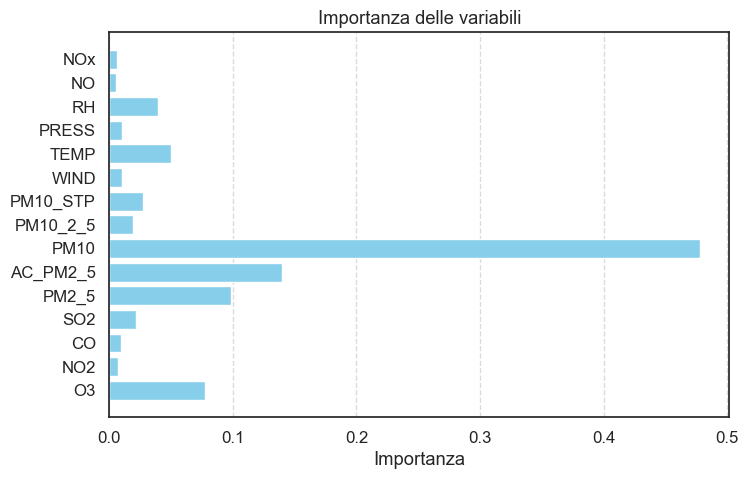

In [170]:
plt.figure(figsize=(8,5))
plt.barh(feature_imp.index, feature_imp['importance'], color='skyblue')
plt.xlabel('Importanza')
plt.title('Importanza delle variabili')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [171]:
print(f"Il numero di feature considerate in fase di training è {RandomForest.n_features_in_}")

Il numero di feature considerate in fase di training è 15


In [172]:
y_hat_RF = RandomForest.predict(X_test)
print(y_hat_RF)
print(f" L'RSE di test è {np.mean((y_test - y_hat_RF)**2)}")

[140.25433376 146.76507929  87.07434534  70.18979708  63.68283009
  89.91048784 130.41168909  59.2279468  102.81731161 133.66808577
  87.16250722 118.62454508  59.76806143  53.17759097 105.13840432
  92.98871335  64.85460666  39.2172741   93.41466952  90.45423193
 115.13251117  99.26457236 107.39015904 111.68482587  66.26314055
  84.93742996 103.84867041  48.56428626 112.19502185  84.71786641
  99.05550186  75.43964354  65.17282786 113.88526457 127.24179497
 134.70262226  54.5294175  110.04516848  64.2847486   63.42131879
  56.30300371  61.82226438 129.01013316  88.66535291 113.01056247
  86.47076746  60.59232368  59.66581466  72.85244613 159.13792087
  45.22441772 110.09357267  62.41755051  57.26241816  75.66588734
 120.70189907  75.67084795  95.54392706 185.4848854   90.4371155
  49.86038339  82.00925387  85.1809021   86.66329999  97.64441564
  41.81930827  95.5228979  107.3526296   63.47343022  45.57110024
  82.07255976  40.82349208  88.0281556   70.00503073 108.13828755
 106.455160

In [173]:
r2_rf = RandomForest.score(X_test, y_test)
print("R^2 :", r2_rf)

R^2 : 0.8113506609651066


# senza outlier

In [174]:
df_ridge_noout=df_ridge.drop(index=Outliers_Indexes)
model = MS(df_ridge_noout.columns.drop('AQI'), intercept=False)
D = model.fit_transform(df_ridge_noout)
feature_names = list(D.columns)
X_ = np.asarray(D)
y_=df_ridge_noout['AQI']

In [175]:
(X__train ,
X__test ,
y__train ,
y__test) = skm.train_test_split(X_,
y_ ,
test_size=0.3,
random_state=0)

In [176]:
def objective1 (trial):
   rf_max_depth=trial.suggest_int('rf_max_depth', 2, 32, log=True)
   rf_n_esimators=trial.suggest_int('rf_n_estimators',50,5000, log=True)
   modello = RF(max_depth=rf_max_depth, n_estimators=rf_n_esimators,random_state=35,n_jobs=-1)
   score = cross_val_score(
        modello, X__train, y__train,
        cv=5,
        scoring="r2"
    ).mean()
   return score

In [177]:
study1 = optuna.create_study(direction='maximize')
study1.optimize(objective1, n_trials=25)

[I 2025-12-27 13:08:53,716] A new study created in memory with name: no-name-68fbd97c-a5ae-45f9-bcbc-c931c5c3089d
[I 2025-12-27 13:08:55,645] Trial 0 finished with value: 0.8238703809623651 and parameters: {'rf_max_depth': 4, 'rf_n_estimators': 212}. Best is trial 0 with value: 0.8238703809623651.
[I 2025-12-27 13:08:56,707] Trial 1 finished with value: 0.8681042947925756 and parameters: {'rf_max_depth': 16, 'rf_n_estimators': 82}. Best is trial 1 with value: 0.8681042947925756.
[I 2025-12-27 13:09:20,545] Trial 2 finished with value: 0.8657558828800116 and parameters: {'rf_max_depth': 19, 'rf_n_estimators': 2043}. Best is trial 1 with value: 0.8681042947925756.
[I 2025-12-27 13:09:22,967] Trial 3 finished with value: 0.6385886977188946 and parameters: {'rf_max_depth': 2, 'rf_n_estimators': 276}. Best is trial 1 with value: 0.8681042947925756.
[I 2025-12-27 13:09:28,847] Trial 4 finished with value: 0.8660737813761014 and parameters: {'rf_max_depth': 16, 'rf_n_estimators': 398}. Best i

In [178]:
print("Best hyperparameters: ", study1.best_params)
print("Best accuracy: ", study1.best_value)

Best hyperparameters:  {'rf_max_depth': 31, 'rf_n_estimators': 50}
Best accuracy:  0.8698006866998075


In [179]:
RandomForest = RF(max_features=15,max_depth=study1.best_params['rf_max_depth'],n_estimators=study1.best_params['rf_n_estimators'],
random_state=35,n_jobs=-1).fit(X__train , y__train)


In [180]:
feature_imp = pd.DataFrame(
{'importance':RandomForest.feature_importances_},
index=feature_names)
feature_imp.sort_values(by='importance', ascending=False)

,importance
PM10,0.452949
AC_PM2_5,0.186459
PM2_5,0.081601
TEMP,0.079138
O3,0.074560
SO2,0.029710
PM10_STP,0.023560
PM10_2_5,0.015263
CO,0.014564
RH,0.010430


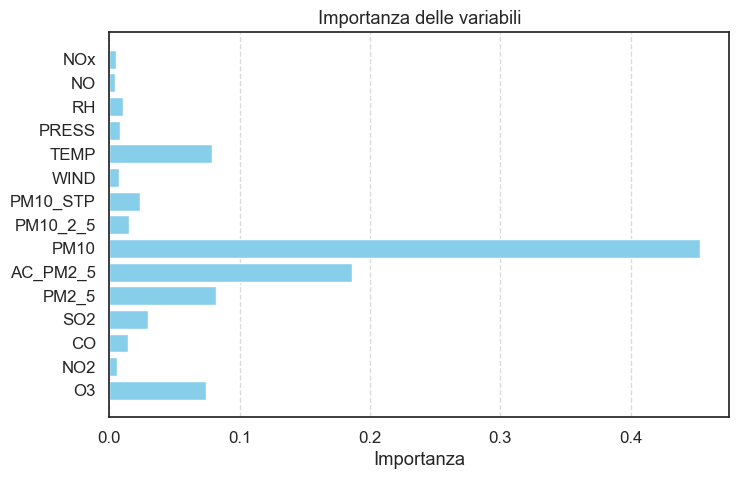

In [181]:
plt.figure(figsize=(8,5))
plt.barh(feature_imp.index, feature_imp['importance'], color='skyblue')
plt.xlabel('Importanza')
plt.title('Importanza delle variabili')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [182]:
print(f"Il numero di feature considerate in fase di training è {RandomForest.n_features_in_}")

Il numero di feature considerate in fase di training è 15


In [183]:
y_hat_RF = RandomForest.predict(X__test)
print(y_hat_RF)
print(f" L'RSE di test è {np.mean((y__test - y_hat_RF)**2)}")

[137.78 104.2   46.94  53.88  58.32  97.02  43.92  44.64  76.58 137.44
  69.84 125.44 145.42 148.    55.22  64.78  84.18 103.52  59.68  91.58
  39.76  98.2  122.74  65.5   61.58  38.98  65.36 103.86  60.64 116.38
  60.2  104.42  87.96  73.3   67.86  52.26  58.3   78.08  78.06 128.96
  49.18  46.08 162.08  82.5   60.78 124.   141.8   86.8   73.34  78.24
  95.94  84.76  58.76 103.26  78.2   85.44 101.76  59.58  92.76  61.6
 132.58  38.9  136.08  47.32  43.14  51.5   53.78  54.94  63.52 125.
 105.42  61.86  96.48 144.26  66.9   96.14  88.48  73.78 102.44 115.46
 133.14  58.22 153.28 150.24  88.6   92.46  40.74  40.24  65.04  64.72
  49.88  60.06 103.64 103.86  88.42  73.28  40.66  80.26 137.72  50.82
 129.58 114.7   99.3  115.3   69.84 132.42  43.56 147.54  39.58 101.04
  89.84  63.88 145.88  41.22 106.84  54.28 116.26 119.62 107.4   98.54
 115.12  96.3   69.66  39.24  65.56  41.68  76.26  44.48 124.5  132.42
 105.44  61.42  63.98  44.4  142.26 126.94  89.24  95.52  89.6   73.44
 106.76  

In [184]:
r2_rf = RandomForest.score(X__test, y__test)
print("R^2 :", r2_rf)

R^2 : 0.8794198324275068


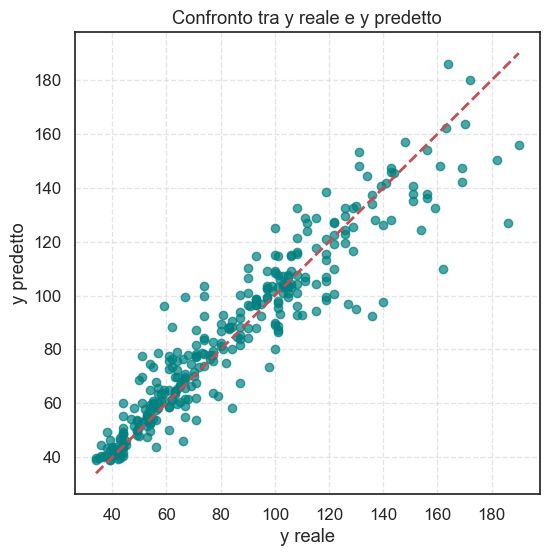

In [185]:
plt.figure(figsize=(6,6))
plt.scatter(y__test, y_hat_RF, color='teal', alpha=0.7)
plt.plot([y__test.min(), y__test.max()],
         [y__test.min(), y__test.max()],
         'r--', lw=2)  
plt.xlabel('y reale')
plt.ylabel('y predetto')
plt.title('Confronto tra y reale e y predetto')
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()

# Selezione degli iperparametri con ricerca randomizzata

## con outlier

In [186]:
a = np.arange(1, 50, 2)        
b = np.arange(50, 501, 20)  

In [187]:
from sklearn.model_selection import RandomizedSearchCV

In [188]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'max_depth': a,'n_estimators' : b}

model = RF(random_state=35,n_jobs=-1)


# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = RandomizedSearchCV(model,
                          param_distributions=param_grid,
    n_iter=100,    
    cv=kfold,
    scoring='r2')
                


grid.fit(X_train, y_train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
                   estimator=RandomForestRegressor(n_jobs=-1, random_state=35),
                   n_iter=100,
                   param_distributions={'max_depth': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49]),
                                        'n_estimators': array([ 50,  70,  90, 110, 130, 150, 170, 190, 210, 230, 250, 270, 290,
       310, 330, 350, 370, 390, 410, 430, 450, 470, 490])},
                   scoring='r2')

In [189]:
best_params = grid.best_params_
best_score = grid.best_score_
print(best_params)
print(best_score)

{'n_estimators': np.int64(250), 'max_depth': np.int64(13)}
0.7870744519196281


In [190]:
RandomForest = RF(max_features=15,max_depth=best_params['max_depth'],n_estimators=best_params['n_estimators'],
random_state=0,n_jobs=-1).fit(X_train , y_train)
y_hat_RF = RandomForest.predict(X_test)
print(f" L'RSE di test è {np.mean((y_test - y_hat_RF)**2)}")

 L'RSE di test è 278.4598994203597


In [191]:
r2_rf = RandomForest.score(X_test, y_test)
print("R^2 :", r2_rf)

R^2 : 0.8096164459531896


## senza outlier

In [192]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'max_depth': a,'n_estimators' : b}

model = RF(random_state=35,n_jobs=-1)


# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = RandomizedSearchCV(model,
                          param_distributions=param_grid,
    n_iter=100,    
    cv=kfold,
    scoring='r2')
                


grid.fit(X__train, y__train)

RandomizedSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
                   estimator=RandomForestRegressor(n_jobs=-1, random_state=35),
                   n_iter=100,
                   param_distributions={'max_depth': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49]),
                                        'n_estimators': array([ 50,  70,  90, 110, 130, 150, 170, 190, 210, 230, 250, 270, 290,
       310, 330, 350, 370, 390, 410, 430, 450, 470, 490])},
                   scoring='r2')

In [193]:
best_params = grid.best_params_
best_score = grid.best_score_
print(best_params)
print(best_score)

{'n_estimators': np.int64(150), 'max_depth': np.int64(11)}
0.8708192426652823


In [194]:
RandomForest = RF(max_features=15,max_depth=best_params['max_depth'],n_estimators=best_params['n_estimators'],
random_state=0,n_jobs=-1).fit(X__train , y__train)
y_hat_RF = RandomForest.predict(X__test)
print(f" L'RSE di test è {np.mean((y__test - y_hat_RF)**2)}")

 L'RSE di test è 152.4643887850096


In [195]:
r2_rf = RandomForest.score(X__test, y__test)
print("R^2 :", r2_rf)

R^2 : 0.8734475543174473


# Gradient Boosting Regressor

## è l'unico metodo del paper per cui sono stati fissati alcuni iperparametri, che useremo

### selezioniamo solo max_depth con grid search

In [196]:
model = MS(dfRidge.columns.drop('AQI'), intercept=False)
D = model.fit_transform(dfRidge)
feature_names = list(D.columns)
X = np.asarray(D)
y=dfRidge['AQI']

In [197]:
(X_train ,
X_test ,
y_train ,
y_test) = skm.train_test_split(X,
y,
test_size=0.3,
random_state=0)

In [198]:
a=np.arange(1,35)

In [199]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'max_depth': a}

model =  GBR(
n_estimators=100,
learning_rate =0.01,
alpha=0.9,
    random_state=0)


# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = skm.GridSearchCV(model,
param_grid,
cv=kfold,
scoring='neg_mean_squared_error')
                

# run della CV
grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=GradientBoostingRegressor(learning_rate=0.01,
                                                 random_state=0),
             param_grid={'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34])},
             scoring='neg_mean_squared_error')

In [200]:
best_params = grid.best_params_
print(best_params)
print('minimo della CV per il GBR', -grid.best_score_)

{'max_depth': np.int64(7)}
minimo della CV per il GBR 738.4556073370488


In [201]:
boost = GBR(
n_estimators=100,
learning_rate =0.01,
alpha=0.9,
max_depth=best_params['max_depth'],
random_state=0)
boost.fit(X_train , y_train)

GradientBoostingRegressor(learning_rate=0.01, max_depth=np.int64(7),
                          random_state=0)

In [202]:
y_hat_boost = boost.predict(X_test)
print(f" L'RSE di test è {np.mean((y_test - y_hat_boost)**2)}")

 L'RSE di test è 555.9857585018136


In [203]:
r2_b = boost.score(X_test, y_test)
print("R^2 :", r2_b)

R^2 : 0.7011910028431843


## senza outlier

In [204]:
model = MS(dfRidge_noout.columns.drop('AQI'), intercept=False)
D = model.fit_transform(dfRidge_noout)
feature_names = list(D.columns)
X_ = np.asarray(D)
y_=dfRidge_noout['AQI']

In [205]:
(X__train ,
X__test ,
y__train ,
y__test) = skm.train_test_split(X_,
y_ ,
test_size=0.3,
random_state=0)

In [206]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'max_depth': a}

model =  GBR(
n_estimators=100,
learning_rate =0.01,
alpha=0.9,
    random_state=0)


# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = skm.GridSearchCV(model,
param_grid,
cv=kfold,
scoring='neg_mean_squared_error')
                

# run della CV
grid.fit(X__train, y__train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=GradientBoostingRegressor(learning_rate=0.01,
                                                 random_state=0),
             param_grid={'max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34])},
             scoring='neg_mean_squared_error')

In [207]:
best_params = grid.best_params_
print(best_params)
print('minimo della CV per il GBR', -grid.best_score_)

{'max_depth': np.int64(8)}
minimo della CV per il GBR 359.91919307199487


In [208]:
boost = GBR(
n_estimators=100,
learning_rate =0.01,
alpha=0.9,
max_depth=best_params['max_depth'],
random_state=0)
boost.fit(X__train , y__train)

GradientBoostingRegressor(learning_rate=0.01, max_depth=np.int64(8),
                          random_state=0)

In [209]:
y_hat_boost = boost.predict(X__test)
print(f" L'RSE di test è {np.mean((y__test - y_hat_boost)**2)}")

 L'RSE di test è 373.70239162549814


In [210]:
r2_b = boost.score(X__test, y__test)
print("R^2 :", r2_b)

R^2 : 0.7346564975984862


# Extra trees regressor

* utilizzo la suddivisione train test già ricavata per GBR connisderando rispettivamente il dataset con outlier (X,y) e senza(X_,y_)

## con outlier

# selezione degli iperparametri tramite optuna

In [211]:
def objective2 (trial):
   etr_max_depth=trial.suggest_int('etr_max_depth', 2, 32, log=True)
   etr_n_esimators=trial.suggest_int('etr_n_estimators',50,5000, log=True)
   modello = ETR(max_depth=etr_max_depth, n_estimators=etr_n_esimators,random_state=35,n_jobs=-1)
   score = cross_val_score(
        modello, X_train, y_train,
        cv=5,
        scoring="r2"
    ).mean()
   return score

In [212]:
study2 = optuna.create_study(direction='maximize')
study2.optimize(objective2, n_trials=25)

[I 2025-12-27 13:26:00,948] A new study created in memory with name: no-name-fea60a9f-755b-4dd1-9b35-2e8f3ae16ca5
[I 2025-12-27 13:26:03,616] Trial 0 finished with value: 0.7712391674739283 and parameters: {'etr_max_depth': 14, 'etr_n_estimators': 396}. Best is trial 0 with value: 0.7712391674739283.
[I 2025-12-27 13:26:05,770] Trial 1 finished with value: 0.6398719276741683 and parameters: {'etr_max_depth': 3, 'etr_n_estimators': 375}. Best is trial 0 with value: 0.7712391674739283.
[I 2025-12-27 13:26:08,101] Trial 2 finished with value: 0.7353455218729839 and parameters: {'etr_max_depth': 5, 'etr_n_estimators': 403}. Best is trial 0 with value: 0.7712391674739283.
[I 2025-12-27 13:26:18,110] Trial 3 finished with value: 0.5185248294342392 and parameters: {'etr_max_depth': 2, 'etr_n_estimators': 1882}. Best is trial 0 with value: 0.7712391674739283.
[I 2025-12-27 13:26:20,299] Trial 4 finished with value: 0.7714328622454605 and parameters: {'etr_max_depth': 20, 'etr_n_estimators': 36

In [213]:
print("Best hyperparameters: ", study2.best_params)
print("Best accuracy: ", study2.best_value)

Best hyperparameters:  {'etr_max_depth': 32, 'etr_n_estimators': 143}
Best accuracy:  0.773975556963072


In [214]:
etr = ETR (criterion='squared_error', max_depth=study2.best_params['etr_max_depth'], min_samples_split=2,n_estimators=study2.best_params['etr_n_estimators'],
random_state=0
)
etr.fit(X_train , y_train)

ExtraTreesRegressor(max_depth=32, n_estimators=143, random_state=0)

In [215]:
y_hat_etr = etr.predict(X_test)
print(f" L'RSE è {np.mean((y_test- y_hat_etr)**2)}")

 L'RSE è 438.4981115857709


In [216]:
r2_etr = etr.score(X_test, y_test)
print("R^2 :", r2_etr)

R^2 : 0.7643335661489352


## senza outlier

In [217]:
def objective3 (trial):
   etr_max_depth=trial.suggest_int('etr_max_depth', 2, 32, log=True)
   etr_n_esimators=trial.suggest_int('etr_n_estimators',50,5000, log=True)
   modello = ETR(max_depth=etr_max_depth, n_estimators=etr_n_esimators,random_state=35,n_jobs=-1)
   score = cross_val_score(
        modello, X__train, y__train,
        cv=5,
        scoring="r2"
    ).mean()
   return score

In [218]:
study3 = optuna.create_study(direction='maximize')
study3.optimize(objective3, n_trials=25)

[I 2025-12-27 13:27:16,427] A new study created in memory with name: no-name-e615f47b-8f6c-4956-9dba-b6542ce2ea33
[I 2025-12-27 13:27:38,162] Trial 0 finished with value: 0.8777927359732504 and parameters: {'etr_max_depth': 24, 'etr_n_estimators': 3511}. Best is trial 0 with value: 0.8777927359732504.
[I 2025-12-27 13:27:43,526] Trial 1 finished with value: 0.7865399435643042 and parameters: {'etr_max_depth': 3, 'etr_n_estimators': 1078}. Best is trial 0 with value: 0.8777927359732504.
[I 2025-12-27 13:27:45,641] Trial 2 finished with value: 0.8771090572419812 and parameters: {'etr_max_depth': 26, 'etr_n_estimators': 375}. Best is trial 0 with value: 0.8777927359732504.
[I 2025-12-27 13:27:46,916] Trial 3 finished with value: 0.8343258009091133 and parameters: {'etr_max_depth': 4, 'etr_n_estimators': 227}. Best is trial 0 with value: 0.8777927359732504.
[I 2025-12-27 13:27:52,266] Trial 4 finished with value: 0.8787133476053745 and parameters: {'etr_max_depth': 13, 'etr_n_estimators': 

In [219]:
print("Best hyperparameters: ", study3.best_params)
print("Best accuracy: ", study3.best_value)

Best hyperparameters:  {'etr_max_depth': 13, 'etr_n_estimators': 906}
Best accuracy:  0.8787133476053745


In [220]:
etr = ETR(
criterion='squared_error', max_depth=study3.best_params['etr_max_depth'], min_samples_split=2,n_estimators=study3.best_params['etr_n_estimators'],
random_state=0
)
etr.fit(X__train , y__train)

ExtraTreesRegressor(max_depth=13, n_estimators=906, random_state=0)

In [221]:
y_hat_etr = etr.predict(X__test)
print(f" L'RSE è {np.mean((y__test- y_hat_etr)**2)}")

 L'RSE è 149.7486094979805


In [222]:
r2_etr = etr.score(X__test, y__test)
print("R^2 :", r2_etr)

R^2 : 0.8936725549143112


# regressione knn

* Anche in questo caso riutilizziamo la suddivisione train test già ricavata per implementare GBR  connisderando rispettivamente il dataset con outlier (X,y) e senza(X_,y_) (in entrambi i casi sono state eliminate le osservazioni con Nan)

# con outlier

In [223]:
from sklearn.neighbors import KNeighborsRegressor

## Selezione iperparametri tramite Optuna

In [224]:
def objective4 (trial):
  k_nn=trial.suggest_int('k_nn', 2, 20, log=True)
  modello = KNeighborsRegressor(n_neighbors=k_nn,n_jobs=-1)
  score = cross_val_score(
        modello, X_train, y_train,
        cv=5,
        scoring="r2"
    ).mean()
  return score

In [225]:
study4 = optuna.create_study(direction='maximize')
study4.optimize(objective4, n_trials=45)

[I 2025-12-27 13:30:49,193] A new study created in memory with name: no-name-3a8e7ab8-7285-47fa-b43f-5173ba540c4e
[I 2025-12-27 13:30:49,305] Trial 0 finished with value: 0.6642554480129809 and parameters: {'k_nn': 17}. Best is trial 0 with value: 0.6642554480129809.
[I 2025-12-27 13:30:49,411] Trial 1 finished with value: 0.6345100012879002 and parameters: {'k_nn': 2}. Best is trial 0 with value: 0.6642554480129809.
[I 2025-12-27 13:30:49,519] Trial 2 finished with value: 0.6767722670027833 and parameters: {'k_nn': 7}. Best is trial 2 with value: 0.6767722670027833.
[I 2025-12-27 13:30:49,626] Trial 3 finished with value: 0.6842766601250441 and parameters: {'k_nn': 3}. Best is trial 3 with value: 0.6842766601250441.
[I 2025-12-27 13:30:49,733] Trial 4 finished with value: 0.6762645796709537 and parameters: {'k_nn': 5}. Best is trial 3 with value: 0.6842766601250441.
[I 2025-12-27 13:30:49,840] Trial 5 finished with value: 0.6345100012879002 and parameters: {'k_nn': 2}. Best is trial 3

In [226]:
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor(n_neighbors=study4.best_params['k_nn'])
neigh.fit(X_train, y_train)


KNeighborsRegressor(n_neighbors=3)

In [227]:
y_hat_neigh=neigh.predict(X_test)
print(f" L'RSE è {np.mean((y_test- y_hat_neigh)**2)}")

 L'RSE è 431.280774550484


In [228]:
r2_neigh = neigh.score(X_test, y_test)
print("R^2 :", r2_neigh)

R^2 : 0.7682124519093694


# Senza outlier

In [229]:
def objective5 (trial):
  k_nn=trial.suggest_int('k_nn', 2, 20, log=True)
  modello = KNeighborsRegressor(n_neighbors=k_nn,n_jobs=-1)
  score = cross_val_score(
        modello, X__train, y__train,
        cv=5,
        scoring="r2"
    ).mean()
  return score

In [230]:
study5 = optuna.create_study(direction='maximize')
study5.optimize(objective5, n_trials=45)

[I 2025-12-27 13:30:54,248] A new study created in memory with name: no-name-78178c76-9f3f-4aa4-b0e0-c80063ad0b77
[I 2025-12-27 13:30:54,357] Trial 0 finished with value: 0.7877615121393987 and parameters: {'k_nn': 6}. Best is trial 0 with value: 0.7877615121393987.
[I 2025-12-27 13:30:54,464] Trial 1 finished with value: 0.7848142851655326 and parameters: {'k_nn': 5}. Best is trial 0 with value: 0.7877615121393987.
[I 2025-12-27 13:30:54,572] Trial 2 finished with value: 0.7746785389877026 and parameters: {'k_nn': 13}. Best is trial 0 with value: 0.7877615121393987.
[I 2025-12-27 13:30:54,680] Trial 3 finished with value: 0.7814631714212136 and parameters: {'k_nn': 11}. Best is trial 0 with value: 0.7877615121393987.
[I 2025-12-27 13:30:54,788] Trial 4 finished with value: 0.7848142851655326 and parameters: {'k_nn': 5}. Best is trial 0 with value: 0.7877615121393987.
[I 2025-12-27 13:30:54,895] Trial 5 finished with value: 0.7690830251133155 and parameters: {'k_nn': 3}. Best is trial 

In [231]:
neigh = KNeighborsRegressor(n_neighbors=study5.best_params['k_nn'])
neigh.fit(X__train,y__train)


KNeighborsRegressor(n_neighbors=7)

In [232]:
y_hat_neigh_=neigh.predict(X__test)
print(f" L'RSE è {np.mean((y__test- y_hat_neigh_)**2)}")

 L'RSE è 298.41687302536076


In [233]:
r2_neigh_ = neigh.score(X__test, y__test)
print("R^2 :", r2_neigh_)

R^2 : 0.7881121982660217


# Selezione iperparametri tramite Grid Search

In [234]:
k=np.arange(1,25)

In [235]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'n_neighbors': k}

model =  KNeighborsRegressor(
n_jobs=-1)


# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = skm.GridSearchCV(model,
param_grid,
cv=kfold,
scoring='neg_mean_squared_error')
                

# run della CV
grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=KNeighborsRegressor(n_jobs=-1),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])},
             scoring='neg_mean_squared_error')

In [236]:
best_params = grid.best_params_
print(best_params)
print('minimo della CV per il GBR', -grid.best_score_)

{'n_neighbors': np.int64(4)}
minimo della CV per il GBR 581.1663124209861


In [237]:
neigh = KNeighborsRegressor(n_neighbors=best_params['n_neighbors'])
neigh.fit(X_train,y_train)


KNeighborsRegressor(n_neighbors=np.int64(4))

In [238]:
y_hat_neigh_=neigh.predict(X_test)
print(f" L'RSE è {np.mean((y_test- y_hat_neigh_)**2)}")

 L'RSE è 446.4971473029046


In [239]:
r2_neigh_ = neigh.score(X_test, y_test)
print("R^2 :", r2_neigh_)

R^2 : 0.7600345642333125


In [240]:
K = 5
kfold = skm.KFold(K,
                  random_state=0,
                  shuffle=True)

param_grid = {'n_neighbors': k}

model =  KNeighborsRegressor(
n_jobs=-1)


# CV: nota che come loss posso definire solo neg_mean_squared_error cioè il mean squared error negativo, 
# quindi per il plot successivo della cv considero - neg_mean_squared_error, cioè cambio segno

grid = skm.GridSearchCV(model,
param_grid,
cv=kfold,
scoring='neg_mean_squared_error')
                

# run della CV
grid.fit(X__train, y__train)

GridSearchCV(cv=KFold(n_splits=5, random_state=0, shuffle=True),
             estimator=KNeighborsRegressor(n_jobs=-1),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])},
             scoring='neg_mean_squared_error')

In [241]:
best_params = grid.best_params_
print(best_params)
print('minimo della CV per il GBR', -grid.best_score_)

{'n_neighbors': np.int64(9)}
minimo della CV per il GBR 286.1863635460858


In [242]:
neigh = KNeighborsRegressor(n_neighbors=best_params['n_neighbors'])
neigh.fit(X__train,y__train)


KNeighborsRegressor(n_neighbors=np.int64(9))

In [243]:
y_hat_neigh_=neigh.predict(X__test)
print(f" L'RSE è {np.mean((y__test- y_hat_neigh_)**2)}")

 L'RSE è 290.2319851231985


In [244]:
r2_neigh_ = neigh.score(X__test, y__test)
print("R^2 :", r2_neigh_)

R^2 : 0.7939237929236764


# Confronto dei risultati ottenuti

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

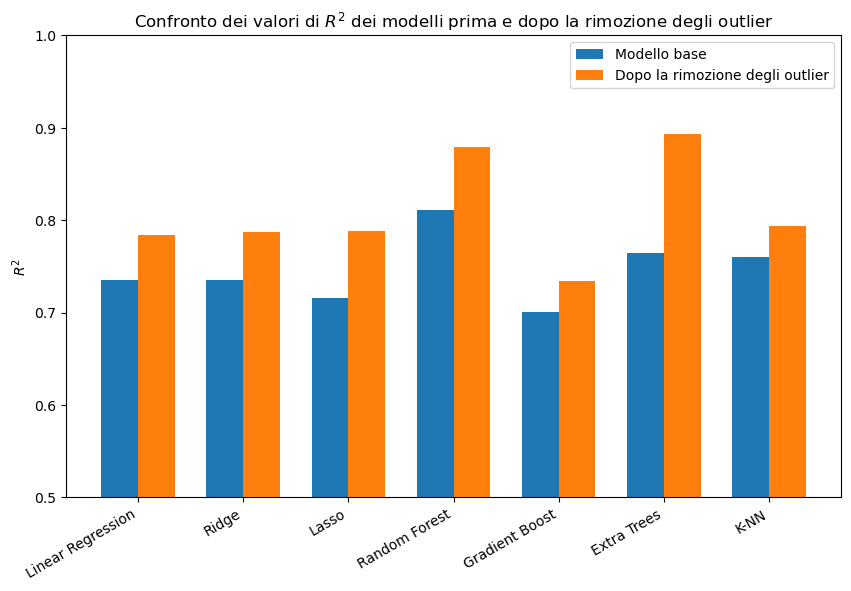

In [2]:

modelli = ['Linear Regression', 'Ridge', 'Lasso', 'Random Forest', 'Gradient Boost', 'Extra Trees','K-NN']
r2_before = [0.7348, 0.7354, 0.71557, 0.8113, 0.701191, 0.76433,0.760034]  # valori prima della rimozione outlier
r2_after  = [0.7837, 0.78756, 0.787914, 0.8794198, 0.7346564, 0.893672,0.7939237]  # valori dopo la rimozione outlier

x = np.arange(len(modelli))  
width = 0.35  

fig, ax = plt.subplots(figsize=(10,6))


bar1 = ax.bar(x - width/2, r2_before, width, label='Modello base')
bar2 = ax.bar(x + width/2, r2_after, width, label='Dopo la rimozione degli outlier')


ax.set_ylabel('$R^2$')
ax.set_title('Confronto dei valori di $R^2$ dei modelli prima e dopo la rimozione degli outlier')
ax.set_xticks(x)
ax.set_xticklabels(modelli, rotation=30, ha='right')
ax.set_ylim(0.5,1)
ax.legend()
